# Check the Python version being used

In [1]:
!python --version

Python 3.7.6


# Check that the available gpu is being utilized

In [2]:
import tensorflow as tf

In [3]:
print("Num GPUs Available")
print(len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available
1


# Start of second method of time series forecasting (cnn) without any normalization and with minimum bridge data

In [21]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [22]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [23]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [24]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [25]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [26]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [27]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [28]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [29]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [30]:
from sklearn.model_selection import train_test_split

n_train_periods = 417
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [31]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (417, 21, 6)
Shape of train_y: (417,)
Shape of test_X: (105, 21, 6)
Shape of test_y: (105,)


# Build cnn model

In [32]:
cnn_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.Conv1D(filters=64, kernel_size=3, input_shape=(train_X.shape[1],train_X.shape[2])),
    tf.keras.layers.GlobalMaxPooling1D(),
    tf.keras.layers.Dense(units=10),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [33]:
from tensorflow import keras

cnn_model.compile(loss='mae', optimizer='adam')

# Train model

In [34]:
history = cnn_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
14/14 - 0s - loss: 746.0661 - val_loss: 956.4213
Epoch 2/2000
14/14 - 0s - loss: 570.3591 - val_loss: 803.0099
Epoch 3/2000
14/14 - 0s - loss: 559.5646 - val_loss: 730.0335
Epoch 4/2000
14/14 - 0s - loss: 344.2872 - val_loss: 263.0467
Epoch 5/2000
14/14 - 0s - loss: 301.6805 - val_loss: 498.9476
Epoch 6/2000
14/14 - 0s - loss: 247.6262 - val_loss: 177.6820
Epoch 7/2000
14/14 - 0s - loss: 179.5943 - val_loss: 193.7155
Epoch 8/2000
14/14 - 0s - loss: 218.6859 - val_loss: 209.3681
Epoch 9/2000
14/14 - 0s - loss: 133.0233 - val_loss: 167.0034
Epoch 10/2000
14/14 - 0s - loss: 171.5599 - val_loss: 167.0427
Epoch 11/2000
14/14 - 0s - loss: 114.6613 - val_loss: 120.9992
Epoch 12/2000
14/14 - 0s - loss: 77.5256 - val_loss: 108.5370
Epoch 13/2000
14/14 - 0s - loss: 70.0560 - val_loss: 161.5016
Epoch 14/2000
14/14 - 0s - loss: 87.1035 - val_loss: 125.0818
Epoch 15/2000
14/14 - 0s - loss: 88.5890 - val_loss: 88.2758
Epoch 16/2000
14/14 - 0s - loss: 180.0218 - val_loss: 358.3692
Epoch 

Epoch 133/2000
14/14 - 0s - loss: 154.5578 - val_loss: 318.3734
Epoch 134/2000
14/14 - 0s - loss: 190.1896 - val_loss: 255.4406
Epoch 135/2000
14/14 - 0s - loss: 95.9039 - val_loss: 120.4850
Epoch 136/2000
14/14 - 0s - loss: 71.3612 - val_loss: 85.9717
Epoch 137/2000
14/14 - 0s - loss: 160.6495 - val_loss: 302.6780
Epoch 138/2000
14/14 - 0s - loss: 99.2423 - val_loss: 108.2762
Epoch 139/2000
14/14 - 0s - loss: 86.9743 - val_loss: 90.2736
Epoch 140/2000
14/14 - 0s - loss: 56.5786 - val_loss: 50.3865
Epoch 141/2000
14/14 - 0s - loss: 80.8754 - val_loss: 85.1794
Epoch 142/2000
14/14 - 0s - loss: 73.8343 - val_loss: 48.3758
Epoch 143/2000
14/14 - 0s - loss: 86.4812 - val_loss: 148.6906
Epoch 144/2000
14/14 - 0s - loss: 109.9682 - val_loss: 171.5567
Epoch 145/2000
14/14 - 0s - loss: 156.3397 - val_loss: 370.1786
Epoch 146/2000
14/14 - 0s - loss: 117.3340 - val_loss: 48.8672
Epoch 147/2000
14/14 - 0s - loss: 78.7710 - val_loss: 47.0697
Epoch 148/2000
14/14 - 0s - loss: 113.2751 - val_loss: 1

Epoch 265/2000
14/14 - 0s - loss: 95.4259 - val_loss: 44.4273
Epoch 266/2000
14/14 - 0s - loss: 34.9339 - val_loss: 47.8404
Epoch 267/2000
14/14 - 0s - loss: 28.1886 - val_loss: 68.3227
Epoch 268/2000
14/14 - 0s - loss: 64.7395 - val_loss: 39.5855
Epoch 269/2000
14/14 - 0s - loss: 38.9583 - val_loss: 99.6405
Epoch 270/2000
14/14 - 0s - loss: 111.3246 - val_loss: 185.8827
Epoch 271/2000
14/14 - 0s - loss: 104.7202 - val_loss: 191.2184
Epoch 272/2000
14/14 - 0s - loss: 102.6919 - val_loss: 155.0779
Epoch 273/2000
14/14 - 0s - loss: 83.3697 - val_loss: 126.6222
Epoch 274/2000
14/14 - 0s - loss: 112.2794 - val_loss: 208.0686
Epoch 275/2000
14/14 - 0s - loss: 94.0755 - val_loss: 69.2054
Epoch 276/2000
14/14 - 0s - loss: 77.1428 - val_loss: 54.1463
Epoch 277/2000
14/14 - 0s - loss: 84.0303 - val_loss: 42.6725
Epoch 278/2000
14/14 - 0s - loss: 34.1796 - val_loss: 95.0309
Epoch 279/2000
14/14 - 0s - loss: 69.5797 - val_loss: 41.8191
Epoch 280/2000
14/14 - 0s - loss: 75.3242 - val_loss: 39.0264

Epoch 397/2000
14/14 - 0s - loss: 51.1486 - val_loss: 43.2969
Epoch 398/2000
14/14 - 0s - loss: 47.5812 - val_loss: 25.5648
Epoch 399/2000
14/14 - 0s - loss: 25.7635 - val_loss: 56.1155
Epoch 400/2000
14/14 - 0s - loss: 52.8767 - val_loss: 89.8865
Epoch 401/2000
14/14 - 0s - loss: 55.0105 - val_loss: 84.4639
Epoch 402/2000
14/14 - 0s - loss: 46.1973 - val_loss: 61.3480
Epoch 403/2000
14/14 - 0s - loss: 47.4939 - val_loss: 25.3653
Epoch 404/2000
14/14 - 0s - loss: 49.2505 - val_loss: 33.1844
Epoch 405/2000
14/14 - 0s - loss: 24.8885 - val_loss: 20.2549
Epoch 406/2000
14/14 - 0s - loss: 43.4385 - val_loss: 27.4164
Epoch 407/2000
14/14 - 0s - loss: 51.5929 - val_loss: 32.6866
Epoch 408/2000
14/14 - 0s - loss: 43.3755 - val_loss: 34.5185
Epoch 409/2000
14/14 - 0s - loss: 34.5627 - val_loss: 60.7742
Epoch 410/2000
14/14 - 0s - loss: 55.4678 - val_loss: 98.8249
Epoch 411/2000
14/14 - 0s - loss: 45.0691 - val_loss: 59.1568
Epoch 412/2000
14/14 - 0s - loss: 40.5169 - val_loss: 40.7055
Epoch 41

Epoch 529/2000
14/14 - 0s - loss: 48.9672 - val_loss: 19.8997
Epoch 530/2000
14/14 - 0s - loss: 40.1512 - val_loss: 61.9757
Epoch 531/2000
14/14 - 0s - loss: 20.4614 - val_loss: 23.7082
Epoch 532/2000
14/14 - 0s - loss: 20.9391 - val_loss: 15.6978
Epoch 533/2000
14/14 - 0s - loss: 19.8889 - val_loss: 73.4396
Epoch 534/2000
14/14 - 0s - loss: 33.7332 - val_loss: 16.0390
Epoch 535/2000
14/14 - 0s - loss: 36.3293 - val_loss: 19.8901
Epoch 536/2000
14/14 - 0s - loss: 29.2969 - val_loss: 56.8446
Epoch 537/2000
14/14 - 0s - loss: 40.5126 - val_loss: 26.0641
Epoch 538/2000
14/14 - 0s - loss: 26.9730 - val_loss: 18.8718
Epoch 539/2000
14/14 - 0s - loss: 38.3931 - val_loss: 40.7165
Epoch 540/2000
14/14 - 0s - loss: 19.3954 - val_loss: 45.5990
Epoch 541/2000
14/14 - 0s - loss: 45.6137 - val_loss: 23.5279
Epoch 542/2000
14/14 - 0s - loss: 37.7960 - val_loss: 50.5795
Epoch 543/2000
14/14 - 0s - loss: 20.4249 - val_loss: 44.7644
Epoch 544/2000
14/14 - 0s - loss: 58.2382 - val_loss: 105.6658
Epoch 5

Epoch 662/2000
14/14 - 0s - loss: 37.0440 - val_loss: 67.7817
Epoch 663/2000
14/14 - 0s - loss: 22.7182 - val_loss: 18.1528
Epoch 664/2000
14/14 - 0s - loss: 12.9858 - val_loss: 17.9987
Epoch 665/2000
14/14 - 0s - loss: 12.9907 - val_loss: 11.9918
Epoch 666/2000
14/14 - 0s - loss: 24.5466 - val_loss: 10.9054
Epoch 667/2000
14/14 - 0s - loss: 27.8898 - val_loss: 19.9228
Epoch 668/2000
14/14 - 0s - loss: 18.3696 - val_loss: 8.1266
Epoch 669/2000
14/14 - 0s - loss: 20.5039 - val_loss: 36.0100
Epoch 670/2000
14/14 - 0s - loss: 39.2080 - val_loss: 18.9071
Epoch 671/2000
14/14 - 0s - loss: 13.4601 - val_loss: 57.7312
Epoch 672/2000
14/14 - 0s - loss: 41.7278 - val_loss: 17.3539
Epoch 673/2000
14/14 - 0s - loss: 13.3042 - val_loss: 16.8668
Epoch 674/2000
14/14 - 0s - loss: 19.3416 - val_loss: 23.8756
Epoch 675/2000
14/14 - 0s - loss: 29.1127 - val_loss: 29.4532
Epoch 676/2000
14/14 - 0s - loss: 34.2447 - val_loss: 11.9551
Epoch 677/2000
14/14 - 0s - loss: 21.1692 - val_loss: 36.1440
Epoch 678

Epoch 795/2000
14/14 - 0s - loss: 24.9417 - val_loss: 38.7922
Epoch 796/2000
14/14 - 0s - loss: 29.3762 - val_loss: 27.6396
Epoch 797/2000
14/14 - 0s - loss: 22.4410 - val_loss: 18.5470
Epoch 798/2000
14/14 - 0s - loss: 25.7993 - val_loss: 10.1437
Epoch 799/2000
14/14 - 0s - loss: 11.8528 - val_loss: 15.0484
Epoch 800/2000
14/14 - 0s - loss: 16.5162 - val_loss: 11.6484
Epoch 801/2000
14/14 - 0s - loss: 24.4869 - val_loss: 25.9076
Epoch 802/2000
14/14 - 0s - loss: 29.8128 - val_loss: 64.5535
Epoch 803/2000
14/14 - 0s - loss: 28.4636 - val_loss: 20.6141
Epoch 804/2000
14/14 - 0s - loss: 17.3210 - val_loss: 9.6524
Epoch 805/2000
14/14 - 0s - loss: 12.4246 - val_loss: 31.7168
Epoch 806/2000
14/14 - 0s - loss: 25.6177 - val_loss: 14.3876
Epoch 807/2000
14/14 - 0s - loss: 19.1080 - val_loss: 20.0727
Epoch 808/2000
14/14 - 0s - loss: 23.3525 - val_loss: 12.9891
Epoch 809/2000
14/14 - 0s - loss: 14.4362 - val_loss: 23.7345
Epoch 810/2000
14/14 - 0s - loss: 16.6432 - val_loss: 14.1488
Epoch 811

Epoch 928/2000
14/14 - 0s - loss: 7.6603 - val_loss: 8.5312
Epoch 929/2000
14/14 - 0s - loss: 7.7543 - val_loss: 13.1344
Epoch 930/2000
14/14 - 0s - loss: 8.9515 - val_loss: 9.2313
Epoch 931/2000
14/14 - 0s - loss: 14.4554 - val_loss: 10.8089
Epoch 932/2000
14/14 - 0s - loss: 20.8427 - val_loss: 15.0043
Epoch 933/2000
14/14 - 0s - loss: 14.5570 - val_loss: 12.9350
Epoch 934/2000
14/14 - 0s - loss: 21.6636 - val_loss: 26.6201
Epoch 935/2000
14/14 - 0s - loss: 25.2020 - val_loss: 43.4971
Epoch 936/2000
14/14 - 0s - loss: 25.2573 - val_loss: 39.7980
Epoch 937/2000
14/14 - 0s - loss: 20.0495 - val_loss: 15.8204
Epoch 938/2000
14/14 - 0s - loss: 14.4502 - val_loss: 29.7180
Epoch 939/2000
14/14 - 0s - loss: 19.4367 - val_loss: 52.0834
Epoch 940/2000
14/14 - 0s - loss: 17.9307 - val_loss: 9.4192
Epoch 941/2000
14/14 - 0s - loss: 10.8819 - val_loss: 9.6343
Epoch 942/2000
14/14 - 0s - loss: 15.1832 - val_loss: 13.4026
Epoch 943/2000
14/14 - 0s - loss: 16.6652 - val_loss: 10.6681
Epoch 944/2000


Epoch 1060/2000
14/14 - 0s - loss: 14.3470 - val_loss: 7.5608
Epoch 1061/2000
14/14 - 0s - loss: 14.1560 - val_loss: 5.7012
Epoch 1062/2000
14/14 - 0s - loss: 8.1274 - val_loss: 11.9773
Epoch 1063/2000
14/14 - 0s - loss: 10.0496 - val_loss: 16.3220
Epoch 1064/2000
14/14 - 0s - loss: 13.1426 - val_loss: 6.2254
Epoch 1065/2000
14/14 - 0s - loss: 12.0848 - val_loss: 7.2849
Epoch 1066/2000
14/14 - 0s - loss: 10.8290 - val_loss: 8.5175
Epoch 1067/2000
14/14 - 0s - loss: 12.3021 - val_loss: 8.4507
Epoch 1068/2000
14/14 - 0s - loss: 11.2405 - val_loss: 8.9321
Epoch 1069/2000
14/14 - 0s - loss: 10.6279 - val_loss: 7.1222
Epoch 1070/2000
14/14 - 0s - loss: 12.0432 - val_loss: 9.4882
Epoch 1071/2000
14/14 - 0s - loss: 15.1126 - val_loss: 13.4783
Epoch 1072/2000
14/14 - 0s - loss: 13.8632 - val_loss: 22.1631
Epoch 1073/2000
14/14 - 0s - loss: 20.6381 - val_loss: 40.5861
Epoch 1074/2000
14/14 - 0s - loss: 30.3827 - val_loss: 47.8470
Epoch 1075/2000
14/14 - 0s - loss: 28.3668 - val_loss: 57.2394
Ep

Epoch 1192/2000
14/14 - 0s - loss: 9.7366 - val_loss: 7.0451
Epoch 1193/2000
14/14 - 0s - loss: 7.3747 - val_loss: 6.6494
Epoch 1194/2000
14/14 - 0s - loss: 8.2018 - val_loss: 8.6676
Epoch 1195/2000
14/14 - 0s - loss: 12.2844 - val_loss: 9.4470
Epoch 1196/2000
14/14 - 0s - loss: 10.3250 - val_loss: 6.7121
Epoch 1197/2000
14/14 - 0s - loss: 10.1769 - val_loss: 18.0592
Epoch 1198/2000
14/14 - 0s - loss: 16.1032 - val_loss: 31.7506
Epoch 1199/2000
14/14 - 0s - loss: 20.3906 - val_loss: 12.6250
Epoch 1200/2000
14/14 - 0s - loss: 11.7483 - val_loss: 14.6628
Epoch 1201/2000
14/14 - 0s - loss: 10.5974 - val_loss: 8.7973
Epoch 1202/2000
14/14 - 0s - loss: 7.0582 - val_loss: 9.8834
Epoch 1203/2000
14/14 - 0s - loss: 11.5674 - val_loss: 10.2157
Epoch 1204/2000
14/14 - 0s - loss: 12.9679 - val_loss: 13.2290
Epoch 1205/2000
14/14 - 0s - loss: 12.8985 - val_loss: 19.8312
Epoch 1206/2000
14/14 - 0s - loss: 14.8152 - val_loss: 21.1608
Epoch 1207/2000
14/14 - 0s - loss: 13.2208 - val_loss: 5.8271
Epoc

Epoch 1324/2000
14/14 - 0s - loss: 10.3583 - val_loss: 16.5681
Epoch 1325/2000
14/14 - 0s - loss: 9.2430 - val_loss: 8.1980
Epoch 1326/2000
14/14 - 0s - loss: 7.7390 - val_loss: 6.3885
Epoch 1327/2000
14/14 - 0s - loss: 8.1161 - val_loss: 10.8147
Epoch 1328/2000
14/14 - 0s - loss: 9.0592 - val_loss: 17.5292
Epoch 1329/2000
14/14 - 0s - loss: 12.8096 - val_loss: 15.1697
Epoch 1330/2000
14/14 - 0s - loss: 8.6918 - val_loss: 11.2749
Epoch 1331/2000
14/14 - 0s - loss: 9.7499 - val_loss: 15.9105
Epoch 1332/2000
14/14 - 0s - loss: 8.8624 - val_loss: 6.6482
Epoch 1333/2000
14/14 - 0s - loss: 7.5286 - val_loss: 6.3585
Epoch 1334/2000
14/14 - 0s - loss: 6.5205 - val_loss: 6.5943
Epoch 1335/2000
14/14 - 0s - loss: 6.4424 - val_loss: 10.0453
Epoch 1336/2000
14/14 - 0s - loss: 9.1532 - val_loss: 11.4544
Epoch 1337/2000
14/14 - 0s - loss: 10.3743 - val_loss: 25.6633
Epoch 1338/2000
14/14 - 0s - loss: 12.3431 - val_loss: 11.2681
Epoch 1339/2000
14/14 - 0s - loss: 8.8770 - val_loss: 7.8350
Epoch 1340

Epoch 1457/2000
14/14 - 0s - loss: 6.5195 - val_loss: 7.4904
Epoch 1458/2000
14/14 - 0s - loss: 7.8592 - val_loss: 14.8749
Epoch 1459/2000
14/14 - 0s - loss: 10.9351 - val_loss: 7.9448
Epoch 1460/2000
14/14 - 0s - loss: 8.1094 - val_loss: 10.8406
Epoch 1461/2000
14/14 - 0s - loss: 8.5699 - val_loss: 15.9507
Epoch 1462/2000
14/14 - 0s - loss: 10.6537 - val_loss: 14.9512
Epoch 1463/2000
14/14 - 0s - loss: 8.0686 - val_loss: 6.4587
Epoch 1464/2000
14/14 - 0s - loss: 7.4295 - val_loss: 6.7779
Epoch 1465/2000
14/14 - 0s - loss: 6.3097 - val_loss: 7.4762
Epoch 1466/2000
14/14 - 0s - loss: 10.3251 - val_loss: 21.9291
Epoch 1467/2000
14/14 - 0s - loss: 14.2918 - val_loss: 5.8834
Epoch 1468/2000
14/14 - 0s - loss: 6.9878 - val_loss: 8.1497
Epoch 1469/2000
14/14 - 0s - loss: 7.1344 - val_loss: 7.7016
Epoch 1470/2000
14/14 - 0s - loss: 9.8831 - val_loss: 17.8540
Epoch 1471/2000
14/14 - 0s - loss: 8.6440 - val_loss: 10.7513
Epoch 1472/2000
14/14 - 0s - loss: 7.9427 - val_loss: 10.8322
Epoch 1473/2

14/14 - 0s - loss: 11.0214 - val_loss: 7.7490
Epoch 1591/2000
14/14 - 0s - loss: 12.2944 - val_loss: 19.9045
Epoch 1592/2000
14/14 - 0s - loss: 10.1612 - val_loss: 10.6991
Epoch 1593/2000
14/14 - 0s - loss: 10.9678 - val_loss: 10.6765
Epoch 1594/2000
14/14 - 0s - loss: 14.4941 - val_loss: 18.7819
Epoch 1595/2000
14/14 - 0s - loss: 8.3754 - val_loss: 6.4935
Epoch 1596/2000
14/14 - 0s - loss: 10.2787 - val_loss: 8.1684
Epoch 1597/2000
14/14 - 0s - loss: 7.2708 - val_loss: 7.1085
Epoch 1598/2000
14/14 - 0s - loss: 7.0481 - val_loss: 7.8787
Epoch 1599/2000
14/14 - 0s - loss: 11.4308 - val_loss: 13.6292
Epoch 1600/2000
14/14 - 0s - loss: 9.5169 - val_loss: 7.5625
Epoch 1601/2000
14/14 - 0s - loss: 6.7111 - val_loss: 5.4083
Epoch 1602/2000
14/14 - 0s - loss: 8.1947 - val_loss: 10.5856
Epoch 1603/2000
14/14 - 0s - loss: 9.0737 - val_loss: 18.4276
Epoch 1604/2000
14/14 - 0s - loss: 9.9809 - val_loss: 13.5071
Epoch 1605/2000
14/14 - 0s - loss: 8.0816 - val_loss: 11.4484
Epoch 1606/2000
14/14 - 

Epoch 1724/2000
14/14 - 0s - loss: 6.6634 - val_loss: 6.6481
Epoch 1725/2000
14/14 - 0s - loss: 6.3602 - val_loss: 7.1248
Epoch 1726/2000
14/14 - 0s - loss: 6.9461 - val_loss: 12.9529
Epoch 1727/2000
14/14 - 0s - loss: 7.3054 - val_loss: 9.0101
Epoch 1728/2000
14/14 - 0s - loss: 6.6628 - val_loss: 12.1072
Epoch 1729/2000
14/14 - 0s - loss: 8.6695 - val_loss: 12.8588
Epoch 1730/2000
14/14 - 0s - loss: 9.8239 - val_loss: 7.3010
Epoch 1731/2000
14/14 - 0s - loss: 10.1281 - val_loss: 9.9283
Epoch 1732/2000
14/14 - 0s - loss: 8.0562 - val_loss: 10.8307
Epoch 1733/2000
14/14 - 0s - loss: 10.0136 - val_loss: 18.4854
Epoch 1734/2000
14/14 - 0s - loss: 8.2894 - val_loss: 6.7083
Epoch 1735/2000
14/14 - 0s - loss: 7.9740 - val_loss: 9.8479
Epoch 1736/2000
14/14 - 0s - loss: 7.8581 - val_loss: 7.7523
Epoch 1737/2000
14/14 - 0s - loss: 9.2622 - val_loss: 15.8633
Epoch 1738/2000
14/14 - 0s - loss: 12.6859 - val_loss: 8.8885
Epoch 1739/2000
14/14 - 0s - loss: 9.1265 - val_loss: 8.6679
Epoch 1740/2000

Epoch 1858/2000
14/14 - 0s - loss: 4.8097 - val_loss: 3.8358
Epoch 1859/2000
14/14 - 0s - loss: 5.0139 - val_loss: 4.4459
Epoch 1860/2000
14/14 - 0s - loss: 4.9875 - val_loss: 4.5418
Epoch 1861/2000
14/14 - 0s - loss: 5.0089 - val_loss: 5.8037
Epoch 1862/2000
14/14 - 0s - loss: 5.8374 - val_loss: 11.6426
Epoch 1863/2000
14/14 - 0s - loss: 6.2006 - val_loss: 5.5165
Epoch 1864/2000
14/14 - 0s - loss: 5.5325 - val_loss: 10.4803
Epoch 1865/2000
14/14 - 0s - loss: 6.0074 - val_loss: 7.7042
Epoch 1866/2000
14/14 - 0s - loss: 7.0173 - val_loss: 12.1049
Epoch 1867/2000
14/14 - 0s - loss: 6.8637 - val_loss: 8.7130
Epoch 1868/2000
14/14 - 0s - loss: 6.1814 - val_loss: 4.7621
Epoch 1869/2000
14/14 - 0s - loss: 4.1685 - val_loss: 3.9648
Epoch 1870/2000
14/14 - 0s - loss: 4.8496 - val_loss: 3.8356
Epoch 1871/2000
14/14 - 0s - loss: 4.9980 - val_loss: 4.0363
Epoch 1872/2000
14/14 - 0s - loss: 5.4251 - val_loss: 6.9496
Epoch 1873/2000
14/14 - 0s - loss: 5.5776 - val_loss: 9.9089
Epoch 1874/2000
14/14

Epoch 1992/2000
14/14 - 0s - loss: 4.3089 - val_loss: 4.6371
Epoch 1993/2000
14/14 - 0s - loss: 5.8544 - val_loss: 5.8968
Epoch 1994/2000
14/14 - 0s - loss: 4.5657 - val_loss: 4.2989
Epoch 1995/2000
14/14 - 0s - loss: 5.2782 - val_loss: 5.8256
Epoch 1996/2000
14/14 - 0s - loss: 6.2885 - val_loss: 13.4041
Epoch 1997/2000
14/14 - 0s - loss: 6.0324 - val_loss: 4.1416
Epoch 1998/2000
14/14 - 0s - loss: 4.4175 - val_loss: 3.1935
Epoch 1999/2000
14/14 - 0s - loss: 4.4977 - val_loss: 3.7285
Epoch 2000/2000
14/14 - 0s - loss: 4.5317 - val_loss: 3.9136


# Plot model loss and validation loss

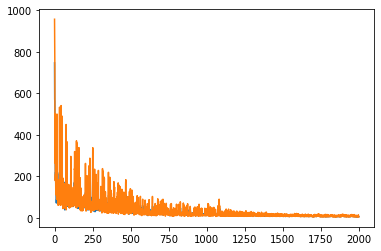

In [35]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [36]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = cnn_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [37]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 6.938824168025591


# Make predictions based on test set and get a root mean squared error 

In [38]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = cnn_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [39]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 6.856592489208911


# Plot train labels along with train predictions

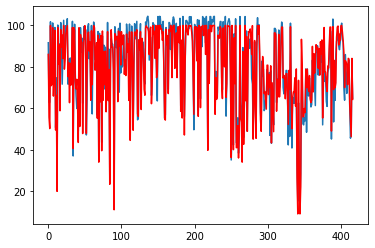

In [40]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

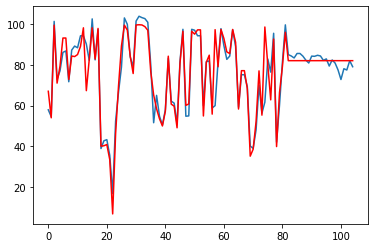

In [41]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with normalization of features

In [42]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [43]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [44]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [45]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [46]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [47]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [48]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [49]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [50]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [51]:
from sklearn.model_selection import train_test_split

n_train_periods = 417
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [54]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [56]:
train_y = train_y.reshape(417,)
test_y = test_y.reshape(105,)

In [57]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (417, 21, 6)
Shape of train_y: (417,)
Shape of test_X: (105, 21, 6)
Shape of test_y: (105,)


# Build cnn model

In [58]:
cnn_norm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.Conv1D(filters=64, kernel_size=3, input_shape=(train_X.shape[1],train_X.shape[2])),
    tf.keras.layers.GlobalMaxPooling1D(),
    tf.keras.layers.Dense(units=10),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [59]:
from tensorflow import keras

cnn_norm_model.compile(loss='mae', optimizer='adam')

# Train model

In [60]:
history = cnn_norm_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
14/14 - 0s - loss: 0.6341 - val_loss: 0.3035
Epoch 2/2000
14/14 - 0s - loss: 0.3513 - val_loss: 0.2785
Epoch 3/2000
14/14 - 0s - loss: 0.2974 - val_loss: 0.2013
Epoch 4/2000
14/14 - 0s - loss: 0.2380 - val_loss: 0.1873
Epoch 5/2000
14/14 - 0s - loss: 0.2061 - val_loss: 0.1685
Epoch 6/2000
14/14 - 0s - loss: 0.1906 - val_loss: 0.1614
Epoch 7/2000
14/14 - 0s - loss: 0.1781 - val_loss: 0.2034
Epoch 8/2000
14/14 - 0s - loss: 0.1924 - val_loss: 0.1668
Epoch 9/2000
14/14 - 0s - loss: 0.1794 - val_loss: 0.1577
Epoch 10/2000
14/14 - 0s - loss: 0.1663 - val_loss: 0.1748
Epoch 11/2000
14/14 - 0s - loss: 0.1697 - val_loss: 0.2266
Epoch 12/2000
14/14 - 0s - loss: 0.2052 - val_loss: 0.1566
Epoch 13/2000
14/14 - 0s - loss: 0.1610 - val_loss: 0.1505
Epoch 14/2000
14/14 - 0s - loss: 0.1529 - val_loss: 0.1741
Epoch 15/2000
14/14 - 0s - loss: 0.1608 - val_loss: 0.2071
Epoch 16/2000
14/14 - 0s - loss: 0.1869 - val_loss: 0.1497
Epoch 17/2000
14/14 - 0s - loss: 0.1548 - val_loss: 0.1496
Epoch 

Epoch 140/2000
14/14 - 0s - loss: 0.1295 - val_loss: 0.1400
Epoch 141/2000
14/14 - 0s - loss: 0.1155 - val_loss: 0.1491
Epoch 142/2000
14/14 - 0s - loss: 0.1135 - val_loss: 0.1507
Epoch 143/2000
14/14 - 0s - loss: 0.1128 - val_loss: 0.1644
Epoch 144/2000
14/14 - 0s - loss: 0.1301 - val_loss: 0.1393
Epoch 145/2000
14/14 - 0s - loss: 0.1156 - val_loss: 0.1511
Epoch 146/2000
14/14 - 0s - loss: 0.1143 - val_loss: 0.1520
Epoch 147/2000
14/14 - 0s - loss: 0.1129 - val_loss: 0.1669
Epoch 148/2000
14/14 - 0s - loss: 0.1342 - val_loss: 0.1398
Epoch 149/2000
14/14 - 0s - loss: 0.1153 - val_loss: 0.1507
Epoch 150/2000
14/14 - 0s - loss: 0.1145 - val_loss: 0.1505
Epoch 151/2000
14/14 - 0s - loss: 0.1135 - val_loss: 0.1664
Epoch 152/2000
14/14 - 0s - loss: 0.1323 - val_loss: 0.1385
Epoch 153/2000
14/14 - 0s - loss: 0.1155 - val_loss: 0.1503
Epoch 154/2000
14/14 - 0s - loss: 0.1146 - val_loss: 0.1512
Epoch 155/2000
14/14 - 0s - loss: 0.1146 - val_loss: 0.1688
Epoch 156/2000
14/14 - 0s - loss: 0.1368

Epoch 277/2000
14/14 - 0s - loss: 0.1107 - val_loss: 0.1511
Epoch 278/2000
14/14 - 0s - loss: 0.1046 - val_loss: 0.1554
Epoch 279/2000
14/14 - 0s - loss: 0.1068 - val_loss: 0.1626
Epoch 280/2000
14/14 - 0s - loss: 0.1232 - val_loss: 0.1388
Epoch 281/2000
14/14 - 0s - loss: 0.1133 - val_loss: 0.1527
Epoch 282/2000
14/14 - 0s - loss: 0.1105 - val_loss: 0.1559
Epoch 283/2000
14/14 - 0s - loss: 0.1107 - val_loss: 0.1646
Epoch 284/2000
14/14 - 0s - loss: 0.1268 - val_loss: 0.1405
Epoch 285/2000
14/14 - 0s - loss: 0.1107 - val_loss: 0.1484
Epoch 286/2000
14/14 - 0s - loss: 0.1062 - val_loss: 0.1553
Epoch 287/2000
14/14 - 0s - loss: 0.1111 - val_loss: 0.1590
Epoch 288/2000
14/14 - 0s - loss: 0.1224 - val_loss: 0.1393
Epoch 289/2000
14/14 - 0s - loss: 0.1073 - val_loss: 0.1472
Epoch 290/2000
14/14 - 0s - loss: 0.1044 - val_loss: 0.1578
Epoch 291/2000
14/14 - 0s - loss: 0.1143 - val_loss: 0.1565
Epoch 292/2000
14/14 - 0s - loss: 0.1206 - val_loss: 0.1404
Epoch 293/2000
14/14 - 0s - loss: 0.1087

Epoch 414/2000
14/14 - 0s - loss: 0.0968 - val_loss: 0.1570
Epoch 415/2000
14/14 - 0s - loss: 0.0971 - val_loss: 0.1601
Epoch 416/2000
14/14 - 0s - loss: 0.1120 - val_loss: 0.1410
Epoch 417/2000
14/14 - 0s - loss: 0.1030 - val_loss: 0.1491
Epoch 418/2000
14/14 - 0s - loss: 0.0969 - val_loss: 0.1549
Epoch 419/2000
14/14 - 0s - loss: 0.0968 - val_loss: 0.1613
Epoch 420/2000
14/14 - 0s - loss: 0.1094 - val_loss: 0.1425
Epoch 421/2000
14/14 - 0s - loss: 0.1000 - val_loss: 0.1472
Epoch 422/2000
14/14 - 0s - loss: 0.0964 - val_loss: 0.1532
Epoch 423/2000
14/14 - 0s - loss: 0.0971 - val_loss: 0.1629
Epoch 424/2000
14/14 - 0s - loss: 0.1118 - val_loss: 0.1431
Epoch 425/2000
14/14 - 0s - loss: 0.1035 - val_loss: 0.1518
Epoch 426/2000
14/14 - 0s - loss: 0.0989 - val_loss: 0.1551
Epoch 427/2000
14/14 - 0s - loss: 0.0964 - val_loss: 0.1644
Epoch 428/2000
14/14 - 0s - loss: 0.1152 - val_loss: 0.1422
Epoch 429/2000
14/14 - 0s - loss: 0.1056 - val_loss: 0.1521
Epoch 430/2000
14/14 - 0s - loss: 0.1011

Epoch 551/2000
14/14 - 0s - loss: 0.1001 - val_loss: 0.1546
Epoch 552/2000
14/14 - 0s - loss: 0.1032 - val_loss: 0.1397
Epoch 553/2000
14/14 - 0s - loss: 0.0946 - val_loss: 0.1460
Epoch 554/2000
14/14 - 0s - loss: 0.0920 - val_loss: 0.1554
Epoch 555/2000
14/14 - 0s - loss: 0.0925 - val_loss: 0.1580
Epoch 556/2000
14/14 - 0s - loss: 0.1024 - val_loss: 0.1413
Epoch 557/2000
14/14 - 0s - loss: 0.0955 - val_loss: 0.1460
Epoch 558/2000
14/14 - 0s - loss: 0.0914 - val_loss: 0.1539
Epoch 559/2000
14/14 - 0s - loss: 0.0900 - val_loss: 0.1615
Epoch 560/2000
14/14 - 0s - loss: 0.1030 - val_loss: 0.1443
Epoch 561/2000
14/14 - 0s - loss: 0.0985 - val_loss: 0.1472
Epoch 562/2000
14/14 - 0s - loss: 0.0937 - val_loss: 0.1515
Epoch 563/2000
14/14 - 0s - loss: 0.0905 - val_loss: 0.1637
Epoch 564/2000
14/14 - 0s - loss: 0.1075 - val_loss: 0.1453
Epoch 565/2000
14/14 - 0s - loss: 0.1042 - val_loss: 0.1495
Epoch 566/2000
14/14 - 0s - loss: 0.0963 - val_loss: 0.1536
Epoch 567/2000
14/14 - 0s - loss: 0.0944

Epoch 688/2000
14/14 - 0s - loss: 0.1060 - val_loss: 0.1405
Epoch 689/2000
14/14 - 0s - loss: 0.0929 - val_loss: 0.1468
Epoch 690/2000
14/14 - 0s - loss: 0.0958 - val_loss: 0.1612
Epoch 691/2000
14/14 - 0s - loss: 0.0976 - val_loss: 0.1619
Epoch 692/2000
14/14 - 0s - loss: 0.1105 - val_loss: 0.1384
Epoch 693/2000
14/14 - 0s - loss: 0.0984 - val_loss: 0.1450
Epoch 694/2000
14/14 - 0s - loss: 0.0979 - val_loss: 0.1631
Epoch 695/2000
14/14 - 0s - loss: 0.1058 - val_loss: 0.1607
Epoch 696/2000
14/14 - 0s - loss: 0.1089 - val_loss: 0.1398
Epoch 697/2000
14/14 - 0s - loss: 0.0945 - val_loss: 0.1437
Epoch 698/2000
14/14 - 0s - loss: 0.0943 - val_loss: 0.1624
Epoch 699/2000
14/14 - 0s - loss: 0.1061 - val_loss: 0.1534
Epoch 700/2000
14/14 - 0s - loss: 0.1050 - val_loss: 0.1406
Epoch 701/2000
14/14 - 0s - loss: 0.0909 - val_loss: 0.1447
Epoch 702/2000
14/14 - 0s - loss: 0.0901 - val_loss: 0.1567
Epoch 703/2000
14/14 - 0s - loss: 0.0946 - val_loss: 0.1553
Epoch 704/2000
14/14 - 0s - loss: 0.1002

Epoch 825/2000
14/14 - 0s - loss: 0.0748 - val_loss: 0.1540
Epoch 826/2000
14/14 - 0s - loss: 0.0825 - val_loss: 0.1548
Epoch 827/2000
14/14 - 0s - loss: 0.0750 - val_loss: 0.1492
Epoch 828/2000
14/14 - 0s - loss: 0.0738 - val_loss: 0.1543
Epoch 829/2000
14/14 - 0s - loss: 0.0762 - val_loss: 0.1541
Epoch 830/2000
14/14 - 0s - loss: 0.0742 - val_loss: 0.1613
Epoch 831/2000
14/14 - 0s - loss: 0.0912 - val_loss: 0.1516
Epoch 832/2000
14/14 - 0s - loss: 0.0848 - val_loss: 0.1538
Epoch 833/2000
14/14 - 0s - loss: 0.0912 - val_loss: 0.1461
Epoch 834/2000
14/14 - 0s - loss: 0.0836 - val_loss: 0.1509
Epoch 835/2000
14/14 - 0s - loss: 0.0764 - val_loss: 0.1499
Epoch 836/2000
14/14 - 0s - loss: 0.0786 - val_loss: 0.1549
Epoch 837/2000
14/14 - 0s - loss: 0.0900 - val_loss: 0.1561
Epoch 838/2000
14/14 - 0s - loss: 0.0769 - val_loss: 0.1489
Epoch 839/2000
14/14 - 0s - loss: 0.0752 - val_loss: 0.1550
Epoch 840/2000
14/14 - 0s - loss: 0.0762 - val_loss: 0.1518
Epoch 841/2000
14/14 - 0s - loss: 0.0726

Epoch 962/2000
14/14 - 0s - loss: 0.0945 - val_loss: 0.1481
Epoch 963/2000
14/14 - 0s - loss: 0.0817 - val_loss: 0.1508
Epoch 964/2000
14/14 - 0s - loss: 0.0816 - val_loss: 0.1470
Epoch 965/2000
14/14 - 0s - loss: 0.0752 - val_loss: 0.1508
Epoch 966/2000
14/14 - 0s - loss: 0.0698 - val_loss: 0.1493
Epoch 967/2000
14/14 - 0s - loss: 0.0764 - val_loss: 0.1542
Epoch 968/2000
14/14 - 0s - loss: 0.0677 - val_loss: 0.1499
Epoch 969/2000
14/14 - 0s - loss: 0.0783 - val_loss: 0.1556
Epoch 970/2000
14/14 - 0s - loss: 0.0668 - val_loss: 0.1519
Epoch 971/2000
14/14 - 0s - loss: 0.0760 - val_loss: 0.1557
Epoch 972/2000
14/14 - 0s - loss: 0.0663 - val_loss: 0.1500
Epoch 973/2000
14/14 - 0s - loss: 0.0736 - val_loss: 0.1577
Epoch 974/2000
14/14 - 0s - loss: 0.0671 - val_loss: 0.1519
Epoch 975/2000
14/14 - 0s - loss: 0.0736 - val_loss: 0.1579
Epoch 976/2000
14/14 - 0s - loss: 0.0688 - val_loss: 0.1527
Epoch 977/2000
14/14 - 0s - loss: 0.0698 - val_loss: 0.1586
Epoch 978/2000
14/14 - 0s - loss: 0.0722

Epoch 1097/2000
14/14 - 0s - loss: 0.0644 - val_loss: 0.1596
Epoch 1098/2000
14/14 - 0s - loss: 0.0795 - val_loss: 0.1543
Epoch 1099/2000
14/14 - 0s - loss: 0.0691 - val_loss: 0.1652
Epoch 1100/2000
14/14 - 0s - loss: 0.0844 - val_loss: 0.1482
Epoch 1101/2000
14/14 - 0s - loss: 0.0750 - val_loss: 0.1542
Epoch 1102/2000
14/14 - 0s - loss: 0.0719 - val_loss: 0.1502
Epoch 1103/2000
14/14 - 0s - loss: 0.0750 - val_loss: 0.1554
Epoch 1104/2000
14/14 - 0s - loss: 0.0663 - val_loss: 0.1507
Epoch 1105/2000
14/14 - 0s - loss: 0.0770 - val_loss: 0.1572
Epoch 1106/2000
14/14 - 0s - loss: 0.0660 - val_loss: 0.1534
Epoch 1107/2000
14/14 - 0s - loss: 0.0792 - val_loss: 0.1585
Epoch 1108/2000
14/14 - 0s - loss: 0.0673 - val_loss: 0.1519
Epoch 1109/2000
14/14 - 0s - loss: 0.0701 - val_loss: 0.1576
Epoch 1110/2000
14/14 - 0s - loss: 0.0660 - val_loss: 0.1536
Epoch 1111/2000
14/14 - 0s - loss: 0.0654 - val_loss: 0.1589
Epoch 1112/2000
14/14 - 0s - loss: 0.0723 - val_loss: 0.1555
Epoch 1113/2000
14/14 - 

Epoch 1232/2000
14/14 - 0s - loss: 0.0874 - val_loss: 0.1467
Epoch 1233/2000
14/14 - 0s - loss: 0.0843 - val_loss: 0.1636
Epoch 1234/2000
14/14 - 0s - loss: 0.0860 - val_loss: 0.1653
Epoch 1235/2000
14/14 - 0s - loss: 0.1022 - val_loss: 0.1399
Epoch 1236/2000
14/14 - 0s - loss: 0.0886 - val_loss: 0.1455
Epoch 1237/2000
14/14 - 0s - loss: 0.0841 - val_loss: 0.1644
Epoch 1238/2000
14/14 - 0s - loss: 0.0901 - val_loss: 0.1648
Epoch 1239/2000
14/14 - 0s - loss: 0.1035 - val_loss: 0.1411
Epoch 1240/2000
14/14 - 0s - loss: 0.0880 - val_loss: 0.1460
Epoch 1241/2000
14/14 - 0s - loss: 0.0846 - val_loss: 0.1663
Epoch 1242/2000
14/14 - 0s - loss: 0.0980 - val_loss: 0.1586
Epoch 1243/2000
14/14 - 0s - loss: 0.0981 - val_loss: 0.1403
Epoch 1244/2000
14/14 - 0s - loss: 0.0826 - val_loss: 0.1460
Epoch 1245/2000
14/14 - 0s - loss: 0.0795 - val_loss: 0.1630
Epoch 1246/2000
14/14 - 0s - loss: 0.0836 - val_loss: 0.1499
Epoch 1247/2000
14/14 - 0s - loss: 0.0821 - val_loss: 0.1434
Epoch 1248/2000
14/14 - 

Epoch 1367/2000
14/14 - 0s - loss: 0.0884 - val_loss: 0.1648
Epoch 1368/2000
14/14 - 0s - loss: 0.0998 - val_loss: 0.1414
Epoch 1369/2000
14/14 - 0s - loss: 0.0834 - val_loss: 0.1464
Epoch 1370/2000
14/14 - 0s - loss: 0.0810 - val_loss: 0.1648
Epoch 1371/2000
14/14 - 0s - loss: 0.0869 - val_loss: 0.1639
Epoch 1372/2000
14/14 - 0s - loss: 0.1001 - val_loss: 0.1418
Epoch 1373/2000
14/14 - 0s - loss: 0.0852 - val_loss: 0.1473
Epoch 1374/2000
14/14 - 0s - loss: 0.0810 - val_loss: 0.1645
Epoch 1375/2000
14/14 - 0s - loss: 0.0871 - val_loss: 0.1634
Epoch 1376/2000
14/14 - 0s - loss: 0.0985 - val_loss: 0.1416
Epoch 1377/2000
14/14 - 0s - loss: 0.0841 - val_loss: 0.1464
Epoch 1378/2000
14/14 - 0s - loss: 0.0772 - val_loss: 0.1652
Epoch 1379/2000
14/14 - 0s - loss: 0.0855 - val_loss: 0.1512
Epoch 1380/2000
14/14 - 0s - loss: 0.0800 - val_loss: 0.1452
Epoch 1381/2000
14/14 - 0s - loss: 0.0776 - val_loss: 0.1485
Epoch 1382/2000
14/14 - 0s - loss: 0.0821 - val_loss: 0.1562
Epoch 1383/2000
14/14 - 

Epoch 1502/2000
14/14 - 0s - loss: 0.0889 - val_loss: 0.1498
Epoch 1503/2000
14/14 - 0s - loss: 0.0857 - val_loss: 0.1650
Epoch 1504/2000
14/14 - 0s - loss: 0.0780 - val_loss: 0.1680
Epoch 1505/2000
14/14 - 0s - loss: 0.0964 - val_loss: 0.1411
Epoch 1506/2000
14/14 - 0s - loss: 0.0878 - val_loss: 0.1497
Epoch 1507/2000
14/14 - 0s - loss: 0.0918 - val_loss: 0.1685
Epoch 1508/2000
14/14 - 0s - loss: 0.0916 - val_loss: 0.1692
Epoch 1509/2000
14/14 - 0s - loss: 0.1011 - val_loss: 0.1414
Epoch 1510/2000
14/14 - 0s - loss: 0.0863 - val_loss: 0.1470
Epoch 1511/2000
14/14 - 0s - loss: 0.0879 - val_loss: 0.1683
Epoch 1512/2000
14/14 - 0s - loss: 0.0905 - val_loss: 0.1644
Epoch 1513/2000
14/14 - 0s - loss: 0.0939 - val_loss: 0.1418
Epoch 1514/2000
14/14 - 0s - loss: 0.0830 - val_loss: 0.1471
Epoch 1515/2000
14/14 - 0s - loss: 0.0791 - val_loss: 0.1634
Epoch 1516/2000
14/14 - 0s - loss: 0.0765 - val_loss: 0.1651
Epoch 1517/2000
14/14 - 0s - loss: 0.0937 - val_loss: 0.1412
Epoch 1518/2000
14/14 - 

Epoch 1637/2000
14/14 - 0s - loss: 0.0747 - val_loss: 0.1567
Epoch 1638/2000
14/14 - 0s - loss: 0.0686 - val_loss: 0.1552
Epoch 1639/2000
14/14 - 0s - loss: 0.0777 - val_loss: 0.1607
Epoch 1640/2000
14/14 - 0s - loss: 0.0629 - val_loss: 0.1553
Epoch 1641/2000
14/14 - 0s - loss: 0.0631 - val_loss: 0.1604
Epoch 1642/2000
14/14 - 0s - loss: 0.0636 - val_loss: 0.1561
Epoch 1643/2000
14/14 - 0s - loss: 0.0606 - val_loss: 0.1629
Epoch 1644/2000
14/14 - 0s - loss: 0.0710 - val_loss: 0.1592
Epoch 1645/2000
14/14 - 0s - loss: 0.0636 - val_loss: 0.1632
Epoch 1646/2000
14/14 - 0s - loss: 0.0631 - val_loss: 0.1636
Epoch 1647/2000
14/14 - 0s - loss: 0.0803 - val_loss: 0.1477
Epoch 1648/2000
14/14 - 0s - loss: 0.0718 - val_loss: 0.1545
Epoch 1649/2000
14/14 - 0s - loss: 0.0669 - val_loss: 0.1504
Epoch 1650/2000
14/14 - 0s - loss: 0.0667 - val_loss: 0.1556
Epoch 1651/2000
14/14 - 0s - loss: 0.0690 - val_loss: 0.1578
Epoch 1652/2000
14/14 - 0s - loss: 0.0650 - val_loss: 0.1556
Epoch 1653/2000
14/14 - 

Epoch 1772/2000
14/14 - 0s - loss: 0.0665 - val_loss: 0.1592
Epoch 1773/2000
14/14 - 0s - loss: 0.0844 - val_loss: 0.1652
Epoch 1774/2000
14/14 - 0s - loss: 0.0675 - val_loss: 0.1601
Epoch 1775/2000
14/14 - 0s - loss: 0.0636 - val_loss: 0.1633
Epoch 1776/2000
14/14 - 0s - loss: 0.0643 - val_loss: 0.1589
Epoch 1777/2000
14/14 - 0s - loss: 0.0610 - val_loss: 0.1668
Epoch 1778/2000
14/14 - 0s - loss: 0.0697 - val_loss: 0.1592
Epoch 1779/2000
14/14 - 0s - loss: 0.0625 - val_loss: 0.1688
Epoch 1780/2000
14/14 - 0s - loss: 0.0773 - val_loss: 0.1553
Epoch 1781/2000
14/14 - 0s - loss: 0.0689 - val_loss: 0.1587
Epoch 1782/2000
14/14 - 0s - loss: 0.0730 - val_loss: 0.1511
Epoch 1783/2000
14/14 - 0s - loss: 0.0691 - val_loss: 0.1565
Epoch 1784/2000
14/14 - 0s - loss: 0.0630 - val_loss: 0.1547
Epoch 1785/2000
14/14 - 0s - loss: 0.0686 - val_loss: 0.1616
Epoch 1786/2000
14/14 - 0s - loss: 0.0640 - val_loss: 0.1552
Epoch 1787/2000
14/14 - 0s - loss: 0.0664 - val_loss: 0.1619
Epoch 1788/2000
14/14 - 

Epoch 1907/2000
14/14 - 0s - loss: 0.0693 - val_loss: 0.1669
Epoch 1908/2000
14/14 - 0s - loss: 0.0916 - val_loss: 0.1449
Epoch 1909/2000
14/14 - 0s - loss: 0.0866 - val_loss: 0.1510
Epoch 1910/2000
14/14 - 0s - loss: 0.0810 - val_loss: 0.1689
Epoch 1911/2000
14/14 - 0s - loss: 0.0787 - val_loss: 0.1705
Epoch 1912/2000
14/14 - 0s - loss: 0.0956 - val_loss: 0.1446
Epoch 1913/2000
14/14 - 0s - loss: 0.0789 - val_loss: 0.1500
Epoch 1914/2000
14/14 - 0s - loss: 0.0727 - val_loss: 0.1653
Epoch 1915/2000
14/14 - 0s - loss: 0.0729 - val_loss: 0.1595
Epoch 1916/2000
14/14 - 0s - loss: 0.0756 - val_loss: 0.1529
Epoch 1917/2000
14/14 - 0s - loss: 0.0755 - val_loss: 0.1510
Epoch 1918/2000
14/14 - 0s - loss: 0.0744 - val_loss: 0.1584
Epoch 1919/2000
14/14 - 0s - loss: 0.0630 - val_loss: 0.1559
Epoch 1920/2000
14/14 - 0s - loss: 0.0612 - val_loss: 0.1595
Epoch 1921/2000
14/14 - 0s - loss: 0.0583 - val_loss: 0.1568
Epoch 1922/2000
14/14 - 0s - loss: 0.0583 - val_loss: 0.1633
Epoch 1923/2000
14/14 - 

# Plot model loss and validation loss

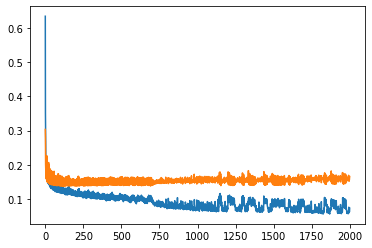

In [61]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [62]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = cnn_norm_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [63]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.11400151618545198


# Make predictions based on test set and get a root mean squared error 

In [64]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = cnn_norm_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [65]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.21108824645683585


# Plot train labels along with train predictions

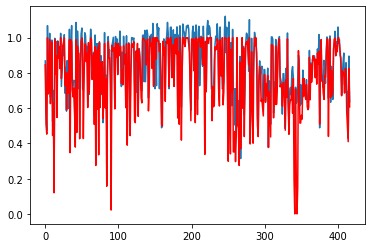

In [66]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

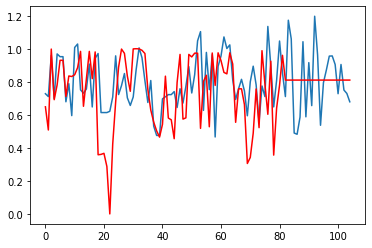

In [67]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with the addition of weather data

In [68]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [69]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [70]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [71]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [72]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [73]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [74]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [75]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [76]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [77]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [78]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [81]:
from sklearn.model_selection import train_test_split

n_train_periods = 417
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [82]:
train_y = train_y.reshape(417,)
test_y = test_y.reshape(105,)

In [83]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (417, 21, 9)
Shape of train_y: (417,)
Shape of test_X: (105, 21, 9)
Shape of test_y: (105,)


# Build cnn model

In [84]:
cnn_combined_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.Conv1D(filters=64, kernel_size=3, input_shape=(train_X.shape[1],train_X.shape[2])),
    tf.keras.layers.GlobalMaxPooling1D(),
    tf.keras.layers.Dense(units=10),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [85]:
from tensorflow import keras

cnn_combined_model.compile(loss='mae', optimizer='adam')

# Train model

In [86]:
history = cnn_combined_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
14/14 - 0s - loss: 2025.8402 - val_loss: 562.6966
Epoch 2/2000
14/14 - 0s - loss: 1522.2139 - val_loss: 756.7173
Epoch 3/2000
14/14 - 0s - loss: 1122.7859 - val_loss: 348.4859
Epoch 4/2000
14/14 - 0s - loss: 995.8014 - val_loss: 293.6013
Epoch 5/2000
14/14 - 0s - loss: 1080.7863 - val_loss: 274.9716
Epoch 6/2000
14/14 - 0s - loss: 941.2859 - val_loss: 265.8392
Epoch 7/2000
14/14 - 0s - loss: 1030.1261 - val_loss: 268.4756
Epoch 8/2000
14/14 - 0s - loss: 843.7127 - val_loss: 246.0564
Epoch 9/2000
14/14 - 0s - loss: 1004.1559 - val_loss: 261.3003
Epoch 10/2000
14/14 - 0s - loss: 824.4283 - val_loss: 248.0011
Epoch 11/2000
14/14 - 0s - loss: 916.7683 - val_loss: 231.1701
Epoch 12/2000
14/14 - 0s - loss: 804.0532 - val_loss: 255.5071
Epoch 13/2000
14/14 - 0s - loss: 810.0720 - val_loss: 200.4828
Epoch 14/2000
14/14 - 0s - loss: 744.3171 - val_loss: 230.0341
Epoch 15/2000
14/14 - 0s - loss: 837.6432 - val_loss: 215.8166
Epoch 16/2000
14/14 - 0s - loss: 731.3685 - val_loss: 236.

Epoch 132/2000
14/14 - 0s - loss: 106.2736 - val_loss: 48.3519
Epoch 133/2000
14/14 - 0s - loss: 63.3137 - val_loss: 49.9408
Epoch 134/2000
14/14 - 0s - loss: 104.7829 - val_loss: 39.6030
Epoch 135/2000
14/14 - 0s - loss: 85.0728 - val_loss: 39.6310
Epoch 136/2000
14/14 - 0s - loss: 103.6555 - val_loss: 45.6002
Epoch 137/2000
14/14 - 0s - loss: 83.1465 - val_loss: 30.3313
Epoch 138/2000
14/14 - 0s - loss: 87.6444 - val_loss: 36.0060
Epoch 139/2000
14/14 - 0s - loss: 81.7773 - val_loss: 29.6034
Epoch 140/2000
14/14 - 0s - loss: 87.3118 - val_loss: 35.6088
Epoch 141/2000
14/14 - 0s - loss: 80.2399 - val_loss: 27.7713
Epoch 142/2000
14/14 - 0s - loss: 85.2217 - val_loss: 37.2228
Epoch 143/2000
14/14 - 0s - loss: 71.8748 - val_loss: 30.8948
Epoch 144/2000
14/14 - 0s - loss: 86.7771 - val_loss: 35.6170
Epoch 145/2000
14/14 - 0s - loss: 78.5175 - val_loss: 27.6921
Epoch 146/2000
14/14 - 0s - loss: 77.9820 - val_loss: 32.7220
Epoch 147/2000
14/14 - 0s - loss: 73.2012 - val_loss: 27.6175
Epoch

Epoch 265/2000
14/14 - 0s - loss: 12.5208 - val_loss: 8.3080
Epoch 266/2000
14/14 - 0s - loss: 17.4274 - val_loss: 10.2744
Epoch 267/2000
14/14 - 0s - loss: 12.3925 - val_loss: 8.5246
Epoch 268/2000
14/14 - 0s - loss: 17.5980 - val_loss: 10.6541
Epoch 269/2000
14/14 - 0s - loss: 13.5934 - val_loss: 9.8354
Epoch 270/2000
14/14 - 0s - loss: 14.4538 - val_loss: 8.8162
Epoch 271/2000
14/14 - 0s - loss: 9.5450 - val_loss: 9.0936
Epoch 272/2000
14/14 - 0s - loss: 13.5874 - val_loss: 8.0237
Epoch 273/2000
14/14 - 0s - loss: 11.8498 - val_loss: 7.2509
Epoch 274/2000
14/14 - 0s - loss: 14.8593 - val_loss: 9.7352
Epoch 275/2000
14/14 - 0s - loss: 12.3296 - val_loss: 6.8423
Epoch 276/2000
14/14 - 0s - loss: 13.6979 - val_loss: 9.4403
Epoch 277/2000
14/14 - 0s - loss: 10.6935 - val_loss: 8.2034
Epoch 278/2000
14/14 - 0s - loss: 14.1669 - val_loss: 9.0266
Epoch 279/2000
14/14 - 0s - loss: 11.9601 - val_loss: 6.7201
Epoch 280/2000
14/14 - 0s - loss: 12.8653 - val_loss: 8.3666
Epoch 281/2000
14/14 - 

Epoch 401/2000
14/14 - 0s - loss: 7.0655 - val_loss: 6.1041
Epoch 402/2000
14/14 - 0s - loss: 8.2036 - val_loss: 6.2544
Epoch 403/2000
14/14 - 0s - loss: 6.8493 - val_loss: 7.5916
Epoch 404/2000
14/14 - 0s - loss: 8.9519 - val_loss: 5.7536
Epoch 405/2000
14/14 - 0s - loss: 6.6168 - val_loss: 8.6357
Epoch 406/2000
14/14 - 0s - loss: 9.0306 - val_loss: 5.2846
Epoch 407/2000
14/14 - 0s - loss: 6.4544 - val_loss: 9.5574
Epoch 408/2000
14/14 - 0s - loss: 8.4243 - val_loss: 6.1881
Epoch 409/2000
14/14 - 0s - loss: 6.5692 - val_loss: 7.1555
Epoch 410/2000
14/14 - 0s - loss: 8.2347 - val_loss: 6.2751
Epoch 411/2000
14/14 - 0s - loss: 6.7955 - val_loss: 7.1727
Epoch 412/2000
14/14 - 0s - loss: 7.6043 - val_loss: 7.5507
Epoch 413/2000
14/14 - 0s - loss: 6.3079 - val_loss: 6.4842
Epoch 414/2000
14/14 - 0s - loss: 6.1526 - val_loss: 5.8011
Epoch 415/2000
14/14 - 0s - loss: 6.1117 - val_loss: 5.6414
Epoch 416/2000
14/14 - 0s - loss: 5.8455 - val_loss: 5.5763
Epoch 417/2000
14/14 - 0s - loss: 5.6814

Epoch 538/2000
14/14 - 0s - loss: 4.8777 - val_loss: 5.5066
Epoch 539/2000
14/14 - 0s - loss: 4.4767 - val_loss: 3.9294
Epoch 540/2000
14/14 - 0s - loss: 5.6347 - val_loss: 9.6920
Epoch 541/2000
14/14 - 0s - loss: 7.1166 - val_loss: 7.3341
Epoch 542/2000
14/14 - 0s - loss: 4.5361 - val_loss: 5.3363
Epoch 543/2000
14/14 - 0s - loss: 4.0303 - val_loss: 7.1052
Epoch 544/2000
14/14 - 0s - loss: 3.9087 - val_loss: 6.8444
Epoch 545/2000
14/14 - 0s - loss: 3.9531 - val_loss: 5.4019
Epoch 546/2000
14/14 - 0s - loss: 3.4964 - val_loss: 4.6732
Epoch 547/2000
14/14 - 0s - loss: 3.9305 - val_loss: 9.8467
Epoch 548/2000
14/14 - 0s - loss: 6.6725 - val_loss: 7.7063
Epoch 549/2000
14/14 - 0s - loss: 4.8498 - val_loss: 9.5146
Epoch 550/2000
14/14 - 0s - loss: 6.0824 - val_loss: 6.0246
Epoch 551/2000
14/14 - 0s - loss: 4.4144 - val_loss: 6.5400
Epoch 552/2000
14/14 - 0s - loss: 4.6283 - val_loss: 9.6855
Epoch 553/2000
14/14 - 0s - loss: 3.7525 - val_loss: 4.0156
Epoch 554/2000
14/14 - 0s - loss: 3.4128

Epoch 675/2000
14/14 - 0s - loss: 3.2861 - val_loss: 5.8490
Epoch 676/2000
14/14 - 0s - loss: 3.5240 - val_loss: 7.7277
Epoch 677/2000
14/14 - 0s - loss: 5.3823 - val_loss: 7.5495
Epoch 678/2000
14/14 - 0s - loss: 3.5258 - val_loss: 3.9471
Epoch 679/2000
14/14 - 0s - loss: 3.9230 - val_loss: 7.0983
Epoch 680/2000
14/14 - 0s - loss: 3.4206 - val_loss: 4.0336
Epoch 681/2000
14/14 - 0s - loss: 3.4883 - val_loss: 3.8157
Epoch 682/2000
14/14 - 0s - loss: 5.0756 - val_loss: 10.8768
Epoch 683/2000
14/14 - 0s - loss: 6.1630 - val_loss: 9.3674
Epoch 684/2000
14/14 - 0s - loss: 8.2120 - val_loss: 5.1281
Epoch 685/2000
14/14 - 0s - loss: 4.4439 - val_loss: 7.1632
Epoch 686/2000
14/14 - 0s - loss: 3.4449 - val_loss: 3.7224
Epoch 687/2000
14/14 - 0s - loss: 2.9749 - val_loss: 4.1892
Epoch 688/2000
14/14 - 0s - loss: 3.5171 - val_loss: 4.6154
Epoch 689/2000
14/14 - 0s - loss: 2.0804 - val_loss: 4.6565
Epoch 690/2000
14/14 - 0s - loss: 3.0560 - val_loss: 2.4644
Epoch 691/2000
14/14 - 0s - loss: 1.983

Epoch 812/2000
14/14 - 0s - loss: 4.3573 - val_loss: 5.3007
Epoch 813/2000
14/14 - 0s - loss: 2.6584 - val_loss: 2.8341
Epoch 814/2000
14/14 - 0s - loss: 3.5866 - val_loss: 7.8385
Epoch 815/2000
14/14 - 0s - loss: 3.9525 - val_loss: 4.4949
Epoch 816/2000
14/14 - 0s - loss: 2.8947 - val_loss: 2.0993
Epoch 817/2000
14/14 - 0s - loss: 2.1044 - val_loss: 2.4252
Epoch 818/2000
14/14 - 0s - loss: 3.0974 - val_loss: 3.9131
Epoch 819/2000
14/14 - 0s - loss: 1.7401 - val_loss: 3.0294
Epoch 820/2000
14/14 - 0s - loss: 2.5934 - val_loss: 3.7888
Epoch 821/2000
14/14 - 0s - loss: 2.3825 - val_loss: 2.1890
Epoch 822/2000
14/14 - 0s - loss: 1.4946 - val_loss: 1.7247
Epoch 823/2000
14/14 - 0s - loss: 1.9012 - val_loss: 1.6164
Epoch 824/2000
14/14 - 0s - loss: 1.5943 - val_loss: 3.8354
Epoch 825/2000
14/14 - 0s - loss: 3.2349 - val_loss: 5.7303
Epoch 826/2000
14/14 - 0s - loss: 2.8860 - val_loss: 4.4613
Epoch 827/2000
14/14 - 0s - loss: 2.6196 - val_loss: 2.6136
Epoch 828/2000
14/14 - 0s - loss: 2.5755

Epoch 949/2000
14/14 - 0s - loss: 3.4235 - val_loss: 7.1658
Epoch 950/2000
14/14 - 0s - loss: 3.2519 - val_loss: 3.5370
Epoch 951/2000
14/14 - 0s - loss: 3.5872 - val_loss: 4.0144
Epoch 952/2000
14/14 - 0s - loss: 2.8829 - val_loss: 5.9656
Epoch 953/2000
14/14 - 0s - loss: 2.5473 - val_loss: 1.9602
Epoch 954/2000
14/14 - 0s - loss: 1.3997 - val_loss: 2.2533
Epoch 955/2000
14/14 - 0s - loss: 1.5719 - val_loss: 3.9774
Epoch 956/2000
14/14 - 0s - loss: 3.0534 - val_loss: 2.3247
Epoch 957/2000
14/14 - 0s - loss: 2.2140 - val_loss: 3.1175
Epoch 958/2000
14/14 - 0s - loss: 3.2705 - val_loss: 5.1769
Epoch 959/2000
14/14 - 0s - loss: 2.1803 - val_loss: 4.4710
Epoch 960/2000
14/14 - 0s - loss: 2.9147 - val_loss: 4.7871
Epoch 961/2000
14/14 - 0s - loss: 2.6346 - val_loss: 4.9584
Epoch 962/2000
14/14 - 0s - loss: 3.3845 - val_loss: 3.5867
Epoch 963/2000
14/14 - 0s - loss: 2.3335 - val_loss: 4.4578
Epoch 964/2000
14/14 - 0s - loss: 3.1589 - val_loss: 4.7220
Epoch 965/2000
14/14 - 0s - loss: 2.8339

Epoch 1085/2000
14/14 - 0s - loss: 3.7269 - val_loss: 6.4173
Epoch 1086/2000
14/14 - 0s - loss: 2.3239 - val_loss: 1.5206
Epoch 1087/2000
14/14 - 0s - loss: 1.8020 - val_loss: 1.2395
Epoch 1088/2000
14/14 - 0s - loss: 1.1707 - val_loss: 2.4308
Epoch 1089/2000
14/14 - 0s - loss: 2.8076 - val_loss: 2.9192
Epoch 1090/2000
14/14 - 0s - loss: 1.5777 - val_loss: 3.6328
Epoch 1091/2000
14/14 - 0s - loss: 2.9534 - val_loss: 2.1746
Epoch 1092/2000
14/14 - 0s - loss: 1.7436 - val_loss: 2.6679
Epoch 1093/2000
14/14 - 0s - loss: 2.5049 - val_loss: 2.7300
Epoch 1094/2000
14/14 - 0s - loss: 1.3411 - val_loss: 2.2917
Epoch 1095/2000
14/14 - 0s - loss: 2.5114 - val_loss: 3.1904
Epoch 1096/2000
14/14 - 0s - loss: 2.3461 - val_loss: 3.5352
Epoch 1097/2000
14/14 - 0s - loss: 2.7702 - val_loss: 4.9198
Epoch 1098/2000
14/14 - 0s - loss: 2.9470 - val_loss: 6.0792
Epoch 1099/2000
14/14 - 0s - loss: 4.2358 - val_loss: 6.0746
Epoch 1100/2000
14/14 - 0s - loss: 3.3651 - val_loss: 3.2198
Epoch 1101/2000
14/14 - 

Epoch 1220/2000
14/14 - 0s - loss: 1.2763 - val_loss: 1.5536
Epoch 1221/2000
14/14 - 0s - loss: 1.0801 - val_loss: 1.6897
Epoch 1222/2000
14/14 - 0s - loss: 1.1599 - val_loss: 1.3784
Epoch 1223/2000
14/14 - 0s - loss: 1.2765 - val_loss: 2.1628
Epoch 1224/2000
14/14 - 0s - loss: 1.2451 - val_loss: 1.3421
Epoch 1225/2000
14/14 - 0s - loss: 1.3608 - val_loss: 1.6260
Epoch 1226/2000
14/14 - 0s - loss: 1.1351 - val_loss: 2.3221
Epoch 1227/2000
14/14 - 0s - loss: 1.4944 - val_loss: 1.7902
Epoch 1228/2000
14/14 - 0s - loss: 1.3862 - val_loss: 2.2613
Epoch 1229/2000
14/14 - 0s - loss: 2.1574 - val_loss: 3.6681
Epoch 1230/2000
14/14 - 0s - loss: 2.6319 - val_loss: 6.0453
Epoch 1231/2000
14/14 - 0s - loss: 2.2348 - val_loss: 1.7434
Epoch 1232/2000
14/14 - 0s - loss: 0.7237 - val_loss: 1.6916
Epoch 1233/2000
14/14 - 0s - loss: 1.4082 - val_loss: 1.7084
Epoch 1234/2000
14/14 - 0s - loss: 0.8642 - val_loss: 1.5178
Epoch 1235/2000
14/14 - 0s - loss: 1.3164 - val_loss: 2.0947
Epoch 1236/2000
14/14 - 

Epoch 1355/2000
14/14 - 0s - loss: 1.2619 - val_loss: 1.4678
Epoch 1356/2000
14/14 - 0s - loss: 0.6622 - val_loss: 1.7043
Epoch 1357/2000
14/14 - 0s - loss: 0.8834 - val_loss: 1.4540
Epoch 1358/2000
14/14 - 0s - loss: 1.5195 - val_loss: 1.4337
Epoch 1359/2000
14/14 - 0s - loss: 1.2201 - val_loss: 2.1468
Epoch 1360/2000
14/14 - 0s - loss: 1.9181 - val_loss: 2.9895
Epoch 1361/2000
14/14 - 0s - loss: 2.1505 - val_loss: 5.0837
Epoch 1362/2000
14/14 - 0s - loss: 1.9999 - val_loss: 2.8194
Epoch 1363/2000
14/14 - 0s - loss: 1.8826 - val_loss: 2.2275
Epoch 1364/2000
14/14 - 0s - loss: 0.8706 - val_loss: 2.3382
Epoch 1365/2000
14/14 - 0s - loss: 1.0137 - val_loss: 1.8544
Epoch 1366/2000
14/14 - 0s - loss: 1.3893 - val_loss: 1.9177
Epoch 1367/2000
14/14 - 0s - loss: 1.6034 - val_loss: 1.2834
Epoch 1368/2000
14/14 - 0s - loss: 2.2535 - val_loss: 3.2811
Epoch 1369/2000
14/14 - 0s - loss: 1.8090 - val_loss: 1.6447
Epoch 1370/2000
14/14 - 0s - loss: 1.2159 - val_loss: 2.7919
Epoch 1371/2000
14/14 - 

Epoch 1490/2000
14/14 - 0s - loss: 2.3171 - val_loss: 4.2643
Epoch 1491/2000
14/14 - 0s - loss: 3.2851 - val_loss: 5.3243
Epoch 1492/2000
14/14 - 0s - loss: 3.3018 - val_loss: 5.3252
Epoch 1493/2000
14/14 - 0s - loss: 2.3005 - val_loss: 4.1872
Epoch 1494/2000
14/14 - 0s - loss: 2.5537 - val_loss: 2.3191
Epoch 1495/2000
14/14 - 0s - loss: 1.7551 - val_loss: 2.3432
Epoch 1496/2000
14/14 - 0s - loss: 1.3156 - val_loss: 1.6423
Epoch 1497/2000
14/14 - 0s - loss: 1.5998 - val_loss: 2.3015
Epoch 1498/2000
14/14 - 0s - loss: 1.5458 - val_loss: 2.4669
Epoch 1499/2000
14/14 - 0s - loss: 1.4429 - val_loss: 1.5426
Epoch 1500/2000
14/14 - 0s - loss: 1.6834 - val_loss: 1.9712
Epoch 1501/2000
14/14 - 0s - loss: 1.3439 - val_loss: 1.7779
Epoch 1502/2000
14/14 - 0s - loss: 1.8233 - val_loss: 2.7000
Epoch 1503/2000
14/14 - 0s - loss: 1.9784 - val_loss: 2.9652
Epoch 1504/2000
14/14 - 0s - loss: 1.9879 - val_loss: 2.4767
Epoch 1505/2000
14/14 - 0s - loss: 1.5241 - val_loss: 1.7265
Epoch 1506/2000
14/14 - 

Epoch 1625/2000
14/14 - 0s - loss: 1.6966 - val_loss: 1.3581
Epoch 1626/2000
14/14 - 0s - loss: 1.0588 - val_loss: 1.7601
Epoch 1627/2000
14/14 - 0s - loss: 1.5493 - val_loss: 1.6417
Epoch 1628/2000
14/14 - 0s - loss: 1.4605 - val_loss: 1.4401
Epoch 1629/2000
14/14 - 0s - loss: 1.2324 - val_loss: 1.8091
Epoch 1630/2000
14/14 - 0s - loss: 1.7004 - val_loss: 2.5093
Epoch 1631/2000
14/14 - 0s - loss: 1.7507 - val_loss: 2.9688
Epoch 1632/2000
14/14 - 0s - loss: 2.4199 - val_loss: 5.8787
Epoch 1633/2000
14/14 - 0s - loss: 2.9955 - val_loss: 2.2032
Epoch 1634/2000
14/14 - 0s - loss: 2.6989 - val_loss: 5.8228
Epoch 1635/2000
14/14 - 0s - loss: 3.7694 - val_loss: 3.7172
Epoch 1636/2000
14/14 - 0s - loss: 2.2274 - val_loss: 2.1328
Epoch 1637/2000
14/14 - 0s - loss: 1.8732 - val_loss: 2.6755
Epoch 1638/2000
14/14 - 0s - loss: 1.5290 - val_loss: 2.7899
Epoch 1639/2000
14/14 - 0s - loss: 1.9467 - val_loss: 2.9368
Epoch 1640/2000
14/14 - 0s - loss: 3.5462 - val_loss: 6.4573
Epoch 1641/2000
14/14 - 

Epoch 1760/2000
14/14 - 0s - loss: 1.5132 - val_loss: 1.8985
Epoch 1761/2000
14/14 - 0s - loss: 0.8372 - val_loss: 1.4955
Epoch 1762/2000
14/14 - 0s - loss: 0.7457 - val_loss: 1.4279
Epoch 1763/2000
14/14 - 0s - loss: 1.3768 - val_loss: 1.3076
Epoch 1764/2000
14/14 - 0s - loss: 1.2250 - val_loss: 2.4776
Epoch 1765/2000
14/14 - 0s - loss: 1.7343 - val_loss: 2.3911
Epoch 1766/2000
14/14 - 0s - loss: 1.0805 - val_loss: 1.4734
Epoch 1767/2000
14/14 - 0s - loss: 1.3111 - val_loss: 3.1628
Epoch 1768/2000
14/14 - 0s - loss: 2.0193 - val_loss: 2.5755
Epoch 1769/2000
14/14 - 0s - loss: 1.1022 - val_loss: 1.5469
Epoch 1770/2000
14/14 - 0s - loss: 1.1167 - val_loss: 1.8210
Epoch 1771/2000
14/14 - 0s - loss: 1.6019 - val_loss: 1.8215
Epoch 1772/2000
14/14 - 0s - loss: 1.6572 - val_loss: 1.4061
Epoch 1773/2000
14/14 - 0s - loss: 0.8104 - val_loss: 1.9575
Epoch 1774/2000
14/14 - 0s - loss: 1.5433 - val_loss: 1.4017
Epoch 1775/2000
14/14 - 0s - loss: 1.4114 - val_loss: 1.9169
Epoch 1776/2000
14/14 - 

Epoch 1895/2000
14/14 - 0s - loss: 1.3538 - val_loss: 1.4285
Epoch 1896/2000
14/14 - 0s - loss: 1.4241 - val_loss: 2.1069
Epoch 1897/2000
14/14 - 0s - loss: 1.4156 - val_loss: 1.7354
Epoch 1898/2000
14/14 - 0s - loss: 1.3418 - val_loss: 1.9258
Epoch 1899/2000
14/14 - 0s - loss: 1.1449 - val_loss: 1.3245
Epoch 1900/2000
14/14 - 0s - loss: 0.8276 - val_loss: 1.2204
Epoch 1901/2000
14/14 - 0s - loss: 0.5065 - val_loss: 1.5832
Epoch 1902/2000
14/14 - 0s - loss: 0.5567 - val_loss: 1.4287
Epoch 1903/2000
14/14 - 0s - loss: 0.6277 - val_loss: 1.1150
Epoch 1904/2000
14/14 - 0s - loss: 0.8189 - val_loss: 1.9363
Epoch 1905/2000
14/14 - 0s - loss: 0.9631 - val_loss: 1.4955
Epoch 1906/2000
14/14 - 0s - loss: 1.0845 - val_loss: 1.7346
Epoch 1907/2000
14/14 - 0s - loss: 1.5366 - val_loss: 2.1521
Epoch 1908/2000
14/14 - 0s - loss: 0.8689 - val_loss: 1.6068
Epoch 1909/2000
14/14 - 0s - loss: 0.9099 - val_loss: 1.7745
Epoch 1910/2000
14/14 - 0s - loss: 1.4895 - val_loss: 2.3332
Epoch 1911/2000
14/14 - 

# Plot model loss and validation loss

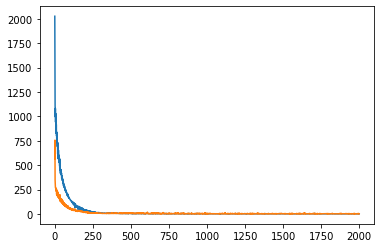

In [87]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [88]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = cnn_combined_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [89]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 1.696001290390734


# Make predictions based on test set and get a root mean squared error 

In [90]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = cnn_combined_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [91]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 4.010732047876758


# Plot train labels along with train predictions

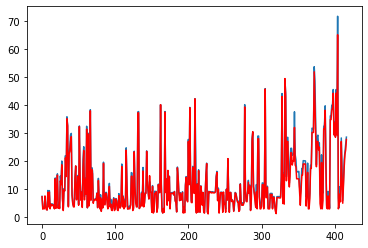

In [92]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

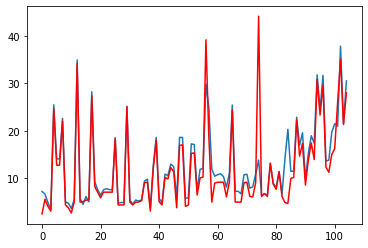

In [93]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of weather data and normalization

In [94]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [95]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [96]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [97]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [98]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [99]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [100]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [101]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [102]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [103]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [104]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [105]:
from sklearn.model_selection import train_test_split

n_train_periods = 417
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [108]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [109]:
train_y = train_y.reshape(417,)
test_y = test_y.reshape(105,)

In [110]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (417, 21, 9)
Shape of train_y: (417,)
Shape of test_X: (105, 21, 9)
Shape of test_y: (105,)


# Build cnn model

In [111]:
cnn_weather_norm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.Conv1D(filters=64, kernel_size=3, input_shape=(train_X.shape[1],train_X.shape[2])),
    tf.keras.layers.GlobalMaxPooling1D(),
    tf.keras.layers.Dense(units=10),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [112]:
from tensorflow import keras

cnn_weather_norm_model.compile(loss='mae', optimizer='adam')

# Train model

In [113]:
history = cnn_weather_norm_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
14/14 - 0s - loss: 0.2171 - val_loss: 0.2460
Epoch 2/2000
14/14 - 0s - loss: 0.2041 - val_loss: 0.2001
Epoch 3/2000
14/14 - 0s - loss: 0.1464 - val_loss: 0.1914
Epoch 4/2000
14/14 - 0s - loss: 0.1388 - val_loss: 0.1791
Epoch 5/2000
14/14 - 0s - loss: 0.1270 - val_loss: 0.1729
Epoch 6/2000
14/14 - 0s - loss: 0.1170 - val_loss: 0.1694
Epoch 7/2000
14/14 - 0s - loss: 0.1138 - val_loss: 0.1640
Epoch 8/2000
14/14 - 0s - loss: 0.1011 - val_loss: 0.1675
Epoch 9/2000
14/14 - 0s - loss: 0.1204 - val_loss: 0.1602
Epoch 10/2000
14/14 - 0s - loss: 0.1204 - val_loss: 0.1570
Epoch 11/2000
14/14 - 0s - loss: 0.1045 - val_loss: 0.1707
Epoch 12/2000
14/14 - 0s - loss: 0.1021 - val_loss: 0.1631
Epoch 13/2000
14/14 - 0s - loss: 0.0990 - val_loss: 0.1589
Epoch 14/2000
14/14 - 0s - loss: 0.0946 - val_loss: 0.1549
Epoch 15/2000
14/14 - 0s - loss: 0.0900 - val_loss: 0.1613
Epoch 16/2000
14/14 - 0s - loss: 0.1117 - val_loss: 0.1565
Epoch 17/2000
14/14 - 0s - loss: 0.1013 - val_loss: 0.1618
Epoch 

Epoch 140/2000
14/14 - 0s - loss: 0.0753 - val_loss: 0.1747
Epoch 141/2000
14/14 - 0s - loss: 0.0637 - val_loss: 0.1707
Epoch 142/2000
14/14 - 0s - loss: 0.0718 - val_loss: 0.1702
Epoch 143/2000
14/14 - 0s - loss: 0.0709 - val_loss: 0.1760
Epoch 144/2000
14/14 - 0s - loss: 0.0652 - val_loss: 0.1831
Epoch 145/2000
14/14 - 0s - loss: 0.0655 - val_loss: 0.1969
Epoch 146/2000
14/14 - 0s - loss: 0.0852 - val_loss: 0.1792
Epoch 147/2000
14/14 - 0s - loss: 0.0747 - val_loss: 0.1758
Epoch 148/2000
14/14 - 0s - loss: 0.0634 - val_loss: 0.1722
Epoch 149/2000
14/14 - 0s - loss: 0.0687 - val_loss: 0.1715
Epoch 150/2000
14/14 - 0s - loss: 0.0692 - val_loss: 0.1721
Epoch 151/2000
14/14 - 0s - loss: 0.0661 - val_loss: 0.1809
Epoch 152/2000
14/14 - 0s - loss: 0.0648 - val_loss: 0.1947
Epoch 153/2000
14/14 - 0s - loss: 0.0818 - val_loss: 0.1795
Epoch 154/2000
14/14 - 0s - loss: 0.0729 - val_loss: 0.1753
Epoch 155/2000
14/14 - 0s - loss: 0.0620 - val_loss: 0.1738
Epoch 156/2000
14/14 - 0s - loss: 0.0675

Epoch 277/2000
14/14 - 0s - loss: 0.0519 - val_loss: 0.1873
Epoch 278/2000
14/14 - 0s - loss: 0.0504 - val_loss: 0.1914
Epoch 279/2000
14/14 - 0s - loss: 0.0553 - val_loss: 0.1872
Epoch 280/2000
14/14 - 0s - loss: 0.0519 - val_loss: 0.1896
Epoch 281/2000
14/14 - 0s - loss: 0.0553 - val_loss: 0.1862
Epoch 282/2000
14/14 - 0s - loss: 0.0578 - val_loss: 0.1908
Epoch 283/2000
14/14 - 0s - loss: 0.0538 - val_loss: 0.1948
Epoch 284/2000
14/14 - 0s - loss: 0.0601 - val_loss: 0.2084
Epoch 285/2000
14/14 - 0s - loss: 0.0699 - val_loss: 0.2103
Epoch 286/2000
14/14 - 0s - loss: 0.0808 - val_loss: 0.1972
Epoch 287/2000
14/14 - 0s - loss: 0.0665 - val_loss: 0.1919
Epoch 288/2000
14/14 - 0s - loss: 0.0582 - val_loss: 0.1869
Epoch 289/2000
14/14 - 0s - loss: 0.0729 - val_loss: 0.1839
Epoch 290/2000
14/14 - 0s - loss: 0.0593 - val_loss: 0.1934
Epoch 291/2000
14/14 - 0s - loss: 0.0560 - val_loss: 0.1974
Epoch 292/2000
14/14 - 0s - loss: 0.0590 - val_loss: 0.2094
Epoch 293/2000
14/14 - 0s - loss: 0.0782

Epoch 414/2000
14/14 - 0s - loss: 0.0564 - val_loss: 0.2117
Epoch 415/2000
14/14 - 0s - loss: 0.0779 - val_loss: 0.1973
Epoch 416/2000
14/14 - 0s - loss: 0.0593 - val_loss: 0.1937
Epoch 417/2000
14/14 - 0s - loss: 0.0623 - val_loss: 0.1882
Epoch 418/2000
14/14 - 0s - loss: 0.0639 - val_loss: 0.1922
Epoch 419/2000
14/14 - 0s - loss: 0.0528 - val_loss: 0.2051
Epoch 420/2000
14/14 - 0s - loss: 0.0687 - val_loss: 0.1964
Epoch 421/2000
14/14 - 0s - loss: 0.0579 - val_loss: 0.1928
Epoch 422/2000
14/14 - 0s - loss: 0.0480 - val_loss: 0.1913
Epoch 423/2000
14/14 - 0s - loss: 0.0517 - val_loss: 0.1932
Epoch 424/2000
14/14 - 0s - loss: 0.0591 - val_loss: 0.1924
Epoch 425/2000
14/14 - 0s - loss: 0.0481 - val_loss: 0.1959
Epoch 426/2000
14/14 - 0s - loss: 0.0478 - val_loss: 0.1979
Epoch 427/2000
14/14 - 0s - loss: 0.0534 - val_loss: 0.2164
Epoch 428/2000
14/14 - 0s - loss: 0.0774 - val_loss: 0.1998
Epoch 429/2000
14/14 - 0s - loss: 0.0608 - val_loss: 0.1968
Epoch 430/2000
14/14 - 0s - loss: 0.0702

Epoch 551/2000
14/14 - 0s - loss: 0.0435 - val_loss: 0.1989
Epoch 552/2000
14/14 - 0s - loss: 0.0460 - val_loss: 0.2010
Epoch 553/2000
14/14 - 0s - loss: 0.0699 - val_loss: 0.1969
Epoch 554/2000
14/14 - 0s - loss: 0.0549 - val_loss: 0.1985
Epoch 555/2000
14/14 - 0s - loss: 0.0459 - val_loss: 0.2046
Epoch 556/2000
14/14 - 0s - loss: 0.0460 - val_loss: 0.2063
Epoch 557/2000
14/14 - 0s - loss: 0.0559 - val_loss: 0.1986
Epoch 558/2000
14/14 - 0s - loss: 0.0436 - val_loss: 0.1969
Epoch 559/2000
14/14 - 0s - loss: 0.0435 - val_loss: 0.1992
Epoch 560/2000
14/14 - 0s - loss: 0.0432 - val_loss: 0.1993
Epoch 561/2000
14/14 - 0s - loss: 0.0479 - val_loss: 0.1972
Epoch 562/2000
14/14 - 0s - loss: 0.0532 - val_loss: 0.1979
Epoch 563/2000
14/14 - 0s - loss: 0.0675 - val_loss: 0.1960
Epoch 564/2000
14/14 - 0s - loss: 0.0494 - val_loss: 0.1970
Epoch 565/2000
14/14 - 0s - loss: 0.0454 - val_loss: 0.2042
Epoch 566/2000
14/14 - 0s - loss: 0.0527 - val_loss: 0.2063
Epoch 567/2000
14/14 - 0s - loss: 0.0488

Epoch 688/2000
14/14 - 0s - loss: 0.0438 - val_loss: 0.2070
Epoch 689/2000
14/14 - 0s - loss: 0.0498 - val_loss: 0.2065
Epoch 690/2000
14/14 - 0s - loss: 0.0474 - val_loss: 0.2037
Epoch 691/2000
14/14 - 0s - loss: 0.0468 - val_loss: 0.2011
Epoch 692/2000
14/14 - 0s - loss: 0.0441 - val_loss: 0.2017
Epoch 693/2000
14/14 - 0s - loss: 0.0585 - val_loss: 0.1968
Epoch 694/2000
14/14 - 0s - loss: 0.0510 - val_loss: 0.1990
Epoch 695/2000
14/14 - 0s - loss: 0.0481 - val_loss: 0.2001
Epoch 696/2000
14/14 - 0s - loss: 0.0423 - val_loss: 0.2007
Epoch 697/2000
14/14 - 0s - loss: 0.0394 - val_loss: 0.2032
Epoch 698/2000
14/14 - 0s - loss: 0.0393 - val_loss: 0.2023
Epoch 699/2000
14/14 - 0s - loss: 0.0429 - val_loss: 0.2042
Epoch 700/2000
14/14 - 0s - loss: 0.0382 - val_loss: 0.2016
Epoch 701/2000
14/14 - 0s - loss: 0.0398 - val_loss: 0.2043
Epoch 702/2000
14/14 - 0s - loss: 0.0408 - val_loss: 0.2019
Epoch 703/2000
14/14 - 0s - loss: 0.0394 - val_loss: 0.2042
Epoch 704/2000
14/14 - 0s - loss: 0.0377

Epoch 825/2000
14/14 - 0s - loss: 0.0501 - val_loss: 0.2065
Epoch 826/2000
14/14 - 0s - loss: 0.0391 - val_loss: 0.2037
Epoch 827/2000
14/14 - 0s - loss: 0.0386 - val_loss: 0.2059
Epoch 828/2000
14/14 - 0s - loss: 0.0389 - val_loss: 0.2048
Epoch 829/2000
14/14 - 0s - loss: 0.0444 - val_loss: 0.2033
Epoch 830/2000
14/14 - 0s - loss: 0.0491 - val_loss: 0.2044
Epoch 831/2000
14/14 - 0s - loss: 0.0531 - val_loss: 0.2051
Epoch 832/2000
14/14 - 0s - loss: 0.0453 - val_loss: 0.2079
Epoch 833/2000
14/14 - 0s - loss: 0.0475 - val_loss: 0.2129
Epoch 834/2000
14/14 - 0s - loss: 0.0454 - val_loss: 0.2116
Epoch 835/2000
14/14 - 0s - loss: 0.0538 - val_loss: 0.2040
Epoch 836/2000
14/14 - 0s - loss: 0.0468 - val_loss: 0.2037
Epoch 837/2000
14/14 - 0s - loss: 0.0600 - val_loss: 0.2001
Epoch 838/2000
14/14 - 0s - loss: 0.0567 - val_loss: 0.2031
Epoch 839/2000
14/14 - 0s - loss: 0.0421 - val_loss: 0.2068
Epoch 840/2000
14/14 - 0s - loss: 0.0410 - val_loss: 0.2080
Epoch 841/2000
14/14 - 0s - loss: 0.0398

Epoch 962/2000
14/14 - 0s - loss: 0.0538 - val_loss: 0.2027
Epoch 963/2000
14/14 - 0s - loss: 0.0453 - val_loss: 0.2034
Epoch 964/2000
14/14 - 0s - loss: 0.0363 - val_loss: 0.2059
Epoch 965/2000
14/14 - 0s - loss: 0.0355 - val_loss: 0.2071
Epoch 966/2000
14/14 - 0s - loss: 0.0382 - val_loss: 0.2099
Epoch 967/2000
14/14 - 0s - loss: 0.0355 - val_loss: 0.2058
Epoch 968/2000
14/14 - 0s - loss: 0.0414 - val_loss: 0.2080
Epoch 969/2000
14/14 - 0s - loss: 0.0359 - val_loss: 0.2054
Epoch 970/2000
14/14 - 0s - loss: 0.0379 - val_loss: 0.2092
Epoch 971/2000
14/14 - 0s - loss: 0.0372 - val_loss: 0.2059
Epoch 972/2000
14/14 - 0s - loss: 0.0371 - val_loss: 0.2092
Epoch 973/2000
14/14 - 0s - loss: 0.0432 - val_loss: 0.2051
Epoch 974/2000
14/14 - 0s - loss: 0.0351 - val_loss: 0.2102
Epoch 975/2000
14/14 - 0s - loss: 0.0381 - val_loss: 0.2072
Epoch 976/2000
14/14 - 0s - loss: 0.0359 - val_loss: 0.2123
Epoch 977/2000
14/14 - 0s - loss: 0.0436 - val_loss: 0.2077
Epoch 978/2000
14/14 - 0s - loss: 0.0358

Epoch 1097/2000
14/14 - 0s - loss: 0.0449 - val_loss: 0.2054
Epoch 1098/2000
14/14 - 0s - loss: 0.0383 - val_loss: 0.2107
Epoch 1099/2000
14/14 - 0s - loss: 0.0450 - val_loss: 0.2096
Epoch 1100/2000
14/14 - 0s - loss: 0.0344 - val_loss: 0.2076
Epoch 1101/2000
14/14 - 0s - loss: 0.0341 - val_loss: 0.2119
Epoch 1102/2000
14/14 - 0s - loss: 0.0363 - val_loss: 0.2111
Epoch 1103/2000
14/14 - 0s - loss: 0.0332 - val_loss: 0.2120
Epoch 1104/2000
14/14 - 0s - loss: 0.0347 - val_loss: 0.2124
Epoch 1105/2000
14/14 - 0s - loss: 0.0522 - val_loss: 0.2073
Epoch 1106/2000
14/14 - 0s - loss: 0.0506 - val_loss: 0.2052
Epoch 1107/2000
14/14 - 0s - loss: 0.0453 - val_loss: 0.2045
Epoch 1108/2000
14/14 - 0s - loss: 0.0393 - val_loss: 0.2080
Epoch 1109/2000
14/14 - 0s - loss: 0.0396 - val_loss: 0.2124
Epoch 1110/2000
14/14 - 0s - loss: 0.0387 - val_loss: 0.2137
Epoch 1111/2000
14/14 - 0s - loss: 0.0480 - val_loss: 0.2098
Epoch 1112/2000
14/14 - 0s - loss: 0.0365 - val_loss: 0.2096
Epoch 1113/2000
14/14 - 

Epoch 1232/2000
14/14 - 0s - loss: 0.0313 - val_loss: 0.2143
Epoch 1233/2000
14/14 - 0s - loss: 0.0351 - val_loss: 0.2093
Epoch 1234/2000
14/14 - 0s - loss: 0.0348 - val_loss: 0.2182
Epoch 1235/2000
14/14 - 0s - loss: 0.0445 - val_loss: 0.2149
Epoch 1236/2000
14/14 - 0s - loss: 0.0388 - val_loss: 0.2127
Epoch 1237/2000
14/14 - 0s - loss: 0.0535 - val_loss: 0.2085
Epoch 1238/2000
14/14 - 0s - loss: 0.0474 - val_loss: 0.2172
Epoch 1239/2000
14/14 - 0s - loss: 0.0572 - val_loss: 0.2126
Epoch 1240/2000
14/14 - 0s - loss: 0.0427 - val_loss: 0.2093
Epoch 1241/2000
14/14 - 0s - loss: 0.0410 - val_loss: 0.2078
Epoch 1242/2000
14/14 - 0s - loss: 0.0325 - val_loss: 0.2087
Epoch 1243/2000
14/14 - 0s - loss: 0.0317 - val_loss: 0.2140
Epoch 1244/2000
14/14 - 0s - loss: 0.0321 - val_loss: 0.2107
Epoch 1245/2000
14/14 - 0s - loss: 0.0343 - val_loss: 0.2142
Epoch 1246/2000
14/14 - 0s - loss: 0.0316 - val_loss: 0.2142
Epoch 1247/2000
14/14 - 0s - loss: 0.0342 - val_loss: 0.2134
Epoch 1248/2000
14/14 - 

Epoch 1367/2000
14/14 - 0s - loss: 0.0536 - val_loss: 0.2048
Epoch 1368/2000
14/14 - 0s - loss: 0.0436 - val_loss: 0.2113
Epoch 1369/2000
14/14 - 0s - loss: 0.0357 - val_loss: 0.2186
Epoch 1370/2000
14/14 - 0s - loss: 0.0451 - val_loss: 0.2192
Epoch 1371/2000
14/14 - 0s - loss: 0.0495 - val_loss: 0.2150
Epoch 1372/2000
14/14 - 0s - loss: 0.0399 - val_loss: 0.2110
Epoch 1373/2000
14/14 - 0s - loss: 0.0582 - val_loss: 0.2030
Epoch 1374/2000
14/14 - 0s - loss: 0.0461 - val_loss: 0.2091
Epoch 1375/2000
14/14 - 0s - loss: 0.0344 - val_loss: 0.2171
Epoch 1376/2000
14/14 - 0s - loss: 0.0404 - val_loss: 0.2170
Epoch 1377/2000
14/14 - 0s - loss: 0.0344 - val_loss: 0.2137
Epoch 1378/2000
14/14 - 0s - loss: 0.0360 - val_loss: 0.2143
Epoch 1379/2000
14/14 - 0s - loss: 0.0356 - val_loss: 0.2140
Epoch 1380/2000
14/14 - 0s - loss: 0.0335 - val_loss: 0.2148
Epoch 1381/2000
14/14 - 0s - loss: 0.0353 - val_loss: 0.2173
Epoch 1382/2000
14/14 - 0s - loss: 0.0501 - val_loss: 0.2115
Epoch 1383/2000
14/14 - 

Epoch 1502/2000
14/14 - 0s - loss: 0.0554 - val_loss: 0.2131
Epoch 1503/2000
14/14 - 0s - loss: 0.0405 - val_loss: 0.2118
Epoch 1504/2000
14/14 - 0s - loss: 0.0408 - val_loss: 0.2103
Epoch 1505/2000
14/14 - 0s - loss: 0.0478 - val_loss: 0.2109
Epoch 1506/2000
14/14 - 0s - loss: 0.0463 - val_loss: 0.2109
Epoch 1507/2000
14/14 - 0s - loss: 0.0373 - val_loss: 0.2138
Epoch 1508/2000
14/14 - 0s - loss: 0.0343 - val_loss: 0.2206
Epoch 1509/2000
14/14 - 0s - loss: 0.0355 - val_loss: 0.2209
Epoch 1510/2000
14/14 - 0s - loss: 0.0395 - val_loss: 0.2260
Epoch 1511/2000
14/14 - 0s - loss: 0.0580 - val_loss: 0.2175
Epoch 1512/2000
14/14 - 0s - loss: 0.0468 - val_loss: 0.2126
Epoch 1513/2000
14/14 - 0s - loss: 0.0569 - val_loss: 0.2037
Epoch 1514/2000
14/14 - 0s - loss: 0.0461 - val_loss: 0.2086
Epoch 1515/2000
14/14 - 0s - loss: 0.0314 - val_loss: 0.2157
Epoch 1516/2000
14/14 - 0s - loss: 0.0307 - val_loss: 0.2236
Epoch 1517/2000
14/14 - 0s - loss: 0.0414 - val_loss: 0.2243
Epoch 1518/2000
14/14 - 

Epoch 1637/2000
14/14 - 0s - loss: 0.0344 - val_loss: 0.2166
Epoch 1638/2000
14/14 - 0s - loss: 0.0302 - val_loss: 0.2179
Epoch 1639/2000
14/14 - 0s - loss: 0.0307 - val_loss: 0.2218
Epoch 1640/2000
14/14 - 0s - loss: 0.0357 - val_loss: 0.2212
Epoch 1641/2000
14/14 - 0s - loss: 0.0481 - val_loss: 0.2167
Epoch 1642/2000
14/14 - 0s - loss: 0.0567 - val_loss: 0.2106
Epoch 1643/2000
14/14 - 0s - loss: 0.0385 - val_loss: 0.2159
Epoch 1644/2000
14/14 - 0s - loss: 0.0323 - val_loss: 0.2170
Epoch 1645/2000
14/14 - 0s - loss: 0.0304 - val_loss: 0.2175
Epoch 1646/2000
14/14 - 0s - loss: 0.0314 - val_loss: 0.2193
Epoch 1647/2000
14/14 - 0s - loss: 0.0303 - val_loss: 0.2189
Epoch 1648/2000
14/14 - 0s - loss: 0.0394 - val_loss: 0.2210
Epoch 1649/2000
14/14 - 0s - loss: 0.0298 - val_loss: 0.2192
Epoch 1650/2000
14/14 - 0s - loss: 0.0301 - val_loss: 0.2206
Epoch 1651/2000
14/14 - 0s - loss: 0.0341 - val_loss: 0.2199
Epoch 1652/2000
14/14 - 0s - loss: 0.0286 - val_loss: 0.2197
Epoch 1653/2000
14/14 - 

Epoch 1772/2000
14/14 - 0s - loss: 0.0314 - val_loss: 0.2198
Epoch 1773/2000
14/14 - 0s - loss: 0.0301 - val_loss: 0.2209
Epoch 1774/2000
14/14 - 0s - loss: 0.0311 - val_loss: 0.2193
Epoch 1775/2000
14/14 - 0s - loss: 0.0310 - val_loss: 0.2223
Epoch 1776/2000
14/14 - 0s - loss: 0.0347 - val_loss: 0.2218
Epoch 1777/2000
14/14 - 0s - loss: 0.0631 - val_loss: 0.2134
Epoch 1778/2000
14/14 - 0s - loss: 0.0428 - val_loss: 0.2185
Epoch 1779/2000
14/14 - 0s - loss: 0.0331 - val_loss: 0.2181
Epoch 1780/2000
14/14 - 0s - loss: 0.0285 - val_loss: 0.2167
Epoch 1781/2000
14/14 - 0s - loss: 0.0304 - val_loss: 0.2222
Epoch 1782/2000
14/14 - 0s - loss: 0.0335 - val_loss: 0.2180
Epoch 1783/2000
14/14 - 0s - loss: 0.0298 - val_loss: 0.2206
Epoch 1784/2000
14/14 - 0s - loss: 0.0288 - val_loss: 0.2225
Epoch 1785/2000
14/14 - 0s - loss: 0.0360 - val_loss: 0.2210
Epoch 1786/2000
14/14 - 0s - loss: 0.0460 - val_loss: 0.2177
Epoch 1787/2000
14/14 - 0s - loss: 0.0441 - val_loss: 0.2161
Epoch 1788/2000
14/14 - 

Epoch 1907/2000
14/14 - 0s - loss: 0.0346 - val_loss: 0.2209
Epoch 1908/2000
14/14 - 0s - loss: 0.0272 - val_loss: 0.2228
Epoch 1909/2000
14/14 - 0s - loss: 0.0293 - val_loss: 0.2243
Epoch 1910/2000
14/14 - 0s - loss: 0.0284 - val_loss: 0.2228
Epoch 1911/2000
14/14 - 0s - loss: 0.0287 - val_loss: 0.2254
Epoch 1912/2000
14/14 - 0s - loss: 0.0530 - val_loss: 0.2230
Epoch 1913/2000
14/14 - 0s - loss: 0.0406 - val_loss: 0.2214
Epoch 1914/2000
14/14 - 0s - loss: 0.0393 - val_loss: 0.2177
Epoch 1915/2000
14/14 - 0s - loss: 0.0484 - val_loss: 0.2140
Epoch 1916/2000
14/14 - 0s - loss: 0.0380 - val_loss: 0.2172
Epoch 1917/2000
14/14 - 0s - loss: 0.0317 - val_loss: 0.2196
Epoch 1918/2000
14/14 - 0s - loss: 0.0312 - val_loss: 0.2244
Epoch 1919/2000
14/14 - 0s - loss: 0.0271 - val_loss: 0.2235
Epoch 1920/2000
14/14 - 0s - loss: 0.0431 - val_loss: 0.2256
Epoch 1921/2000
14/14 - 0s - loss: 0.0327 - val_loss: 0.2261
Epoch 1922/2000
14/14 - 0s - loss: 0.0379 - val_loss: 0.2234
Epoch 1923/2000
14/14 - 

# Plot model loss and validation loss

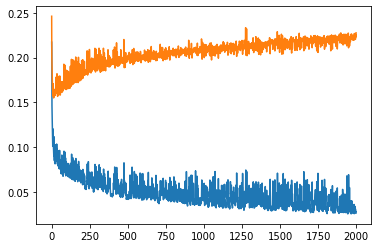

In [114]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [115]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = cnn_weather_norm_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [116]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.06799614902812179


# Make predictions based on test set and get a root mean squared error 

In [117]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = cnn_weather_norm_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [118]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.30353063847328327


# Plot train labels along with train predictions

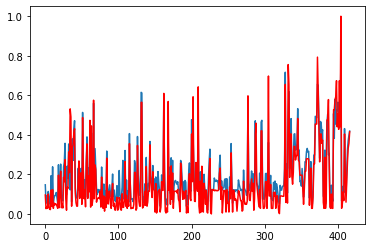

In [119]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

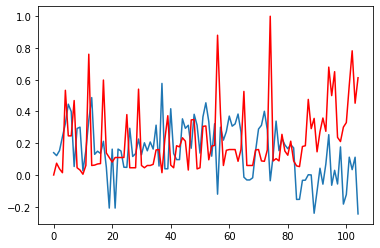

In [120]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with the addition of historical aadt data

In [4]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_with_Historical_AADT.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [5]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 162):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [6]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [7]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [8]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [9]:
for i in range(22):
    print(len(list_of_row_components[i]))

15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15


# Get length of list of lists

In [10]:
len(list_of_row_components)

3542

# Convert format of list to have a single time series for each index

In [11]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [12]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [13]:
list_of_examples.shape

(160, 22, 15)

# Perform train test split for dataset

In [14]:
from sklearn.model_selection import train_test_split

n_train_periods = 96
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [15]:
train_y = train_y.reshape(96,)
test_y = test_y.reshape(64,)

In [16]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (96, 21, 14)
Shape of train_y: (96,)
Shape of test_X: (64, 21, 14)
Shape of test_y: (64,)


# Build CNN model

In [17]:
cnn_aadt_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.Conv1D(filters=64, kernel_size=3, input_shape=(train_X.shape[1],train_X.shape[2])),
    tf.keras.layers.GlobalMaxPooling1D(),
    tf.keras.layers.Dense(units=10),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [18]:
from tensorflow import keras

cnn_aadt_model.compile(loss='mae', optimizer='adam')

# Train model

In [19]:
history = cnn_aadt_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
3/3 - 0s - loss: 3577.1770 - val_loss: 1651.6826
Epoch 2/2000
3/3 - 0s - loss: 2552.0217 - val_loss: 2562.6462
Epoch 3/2000
3/3 - 0s - loss: 2110.4241 - val_loss: 1044.9113
Epoch 4/2000
3/3 - 0s - loss: 1324.4536 - val_loss: 1396.6056
Epoch 5/2000
3/3 - 0s - loss: 1444.2905 - val_loss: 772.9140
Epoch 6/2000
3/3 - 0s - loss: 839.8344 - val_loss: 1201.1876
Epoch 7/2000
3/3 - 0s - loss: 946.1701 - val_loss: 627.0668
Epoch 8/2000
3/3 - 0s - loss: 656.8796 - val_loss: 852.9664
Epoch 9/2000
3/3 - 0s - loss: 565.5837 - val_loss: 853.0933
Epoch 10/2000
3/3 - 0s - loss: 936.4124 - val_loss: 868.2023
Epoch 11/2000
3/3 - 0s - loss: 577.4787 - val_loss: 961.9019
Epoch 12/2000
3/3 - 0s - loss: 977.0026 - val_loss: 647.9839
Epoch 13/2000
3/3 - 0s - loss: 308.5711 - val_loss: 832.8098
Epoch 14/2000
3/3 - 0s - loss: 511.7020 - val_loss: 611.1580
Epoch 15/2000
3/3 - 0s - loss: 279.4998 - val_loss: 666.0438
Epoch 16/2000
3/3 - 0s - loss: 468.5882 - val_loss: 537.7828
Epoch 17/2000
3/3 - 0s 

Epoch 135/2000
3/3 - 0s - loss: 310.4287 - val_loss: 496.1126
Epoch 136/2000
3/3 - 0s - loss: 148.0463 - val_loss: 459.1157
Epoch 137/2000
3/3 - 0s - loss: 132.8154 - val_loss: 569.6589
Epoch 138/2000
3/3 - 0s - loss: 183.8197 - val_loss: 476.6787
Epoch 139/2000
3/3 - 0s - loss: 179.2865 - val_loss: 601.7893
Epoch 140/2000
3/3 - 0s - loss: 209.0853 - val_loss: 460.0032
Epoch 141/2000
3/3 - 0s - loss: 166.8962 - val_loss: 593.0554
Epoch 142/2000
3/3 - 0s - loss: 206.7420 - val_loss: 442.1516
Epoch 143/2000
3/3 - 0s - loss: 151.0560 - val_loss: 616.2233
Epoch 144/2000
3/3 - 0s - loss: 222.1768 - val_loss: 444.6556
Epoch 145/2000
3/3 - 0s - loss: 163.3276 - val_loss: 618.5085
Epoch 146/2000
3/3 - 0s - loss: 230.2934 - val_loss: 453.1459
Epoch 147/2000
3/3 - 0s - loss: 250.9831 - val_loss: 580.0222
Epoch 148/2000
3/3 - 0s - loss: 324.9743 - val_loss: 452.3254
Epoch 149/2000
3/3 - 0s - loss: 209.2675 - val_loss: 458.8190
Epoch 150/2000
3/3 - 0s - loss: 117.1284 - val_loss: 429.1107
Epoch 15

Epoch 268/2000
3/3 - 0s - loss: 138.2728 - val_loss: 528.5836
Epoch 269/2000
3/3 - 0s - loss: 168.9805 - val_loss: 409.0749
Epoch 270/2000
3/3 - 0s - loss: 156.5796 - val_loss: 554.2244
Epoch 271/2000
3/3 - 0s - loss: 181.4042 - val_loss: 396.7528
Epoch 272/2000
3/3 - 0s - loss: 113.3315 - val_loss: 573.6543
Epoch 273/2000
3/3 - 0s - loss: 197.4745 - val_loss: 397.0228
Epoch 274/2000
3/3 - 0s - loss: 146.5527 - val_loss: 537.8770
Epoch 275/2000
3/3 - 0s - loss: 174.2534 - val_loss: 389.4233
Epoch 276/2000
3/3 - 0s - loss: 112.9720 - val_loss: 595.8566
Epoch 277/2000
3/3 - 0s - loss: 209.1401 - val_loss: 386.4821
Epoch 278/2000
3/3 - 0s - loss: 124.9430 - val_loss: 526.1262
Epoch 279/2000
3/3 - 0s - loss: 168.6463 - val_loss: 389.7979
Epoch 280/2000
3/3 - 0s - loss: 140.7835 - val_loss: 548.3425
Epoch 281/2000
3/3 - 0s - loss: 183.3719 - val_loss: 386.1274
Epoch 282/2000
3/3 - 0s - loss: 126.2098 - val_loss: 561.1630
Epoch 283/2000
3/3 - 0s - loss: 191.0906 - val_loss: 384.9318
Epoch 28

Epoch 401/2000
3/3 - 0s - loss: 55.0945 - val_loss: 387.5304
Epoch 402/2000
3/3 - 0s - loss: 51.4298 - val_loss: 382.6237
Epoch 403/2000
3/3 - 0s - loss: 58.4893 - val_loss: 379.5228
Epoch 404/2000
3/3 - 0s - loss: 53.3162 - val_loss: 371.5553
Epoch 405/2000
3/3 - 0s - loss: 102.2521 - val_loss: 506.1937
Epoch 406/2000
3/3 - 0s - loss: 155.9241 - val_loss: 381.4209
Epoch 407/2000
3/3 - 0s - loss: 145.4316 - val_loss: 486.7813
Epoch 408/2000
3/3 - 0s - loss: 148.5497 - val_loss: 378.7822
Epoch 409/2000
3/3 - 0s - loss: 167.7348 - val_loss: 502.4922
Epoch 410/2000
3/3 - 0s - loss: 278.7024 - val_loss: 411.6873
Epoch 411/2000
3/3 - 0s - loss: 202.1939 - val_loss: 378.2794
Epoch 412/2000
3/3 - 0s - loss: 118.3906 - val_loss: 512.8950
Epoch 413/2000
3/3 - 0s - loss: 157.7050 - val_loss: 394.4832
Epoch 414/2000
3/3 - 0s - loss: 216.9706 - val_loss: 528.7773
Epoch 415/2000
3/3 - 0s - loss: 329.2885 - val_loss: 463.6963
Epoch 416/2000
3/3 - 0s - loss: 160.6146 - val_loss: 365.5858
Epoch 417/20

Epoch 534/2000
3/3 - 0s - loss: 131.2709 - val_loss: 411.2987
Epoch 535/2000
3/3 - 0s - loss: 145.1133 - val_loss: 341.7846
Epoch 536/2000
3/3 - 0s - loss: 110.4899 - val_loss: 433.8464
Epoch 537/2000
3/3 - 0s - loss: 192.2234 - val_loss: 342.7411
Epoch 538/2000
3/3 - 0s - loss: 117.0661 - val_loss: 397.5480
Epoch 539/2000
3/3 - 0s - loss: 131.2482 - val_loss: 335.1742
Epoch 540/2000
3/3 - 0s - loss: 117.9246 - val_loss: 427.4376
Epoch 541/2000
3/3 - 0s - loss: 174.1287 - val_loss: 338.3947
Epoch 542/2000
3/3 - 0s - loss: 130.1850 - val_loss: 403.6103
Epoch 543/2000
3/3 - 0s - loss: 129.0589 - val_loss: 333.9228
Epoch 544/2000
3/3 - 0s - loss: 125.6503 - val_loss: 424.4454
Epoch 545/2000
3/3 - 0s - loss: 177.9726 - val_loss: 336.0931
Epoch 546/2000
3/3 - 0s - loss: 108.5938 - val_loss: 417.3900
Epoch 547/2000
3/3 - 0s - loss: 166.6470 - val_loss: 334.0674
Epoch 548/2000
3/3 - 0s - loss: 103.9273 - val_loss: 420.5319
Epoch 549/2000
3/3 - 0s - loss: 164.5342 - val_loss: 334.2108
Epoch 55

Epoch 667/2000
3/3 - 0s - loss: 137.9934 - val_loss: 316.0546
Epoch 668/2000
3/3 - 0s - loss: 80.4814 - val_loss: 384.2136
Epoch 669/2000
3/3 - 0s - loss: 108.9954 - val_loss: 312.8720
Epoch 670/2000
3/3 - 0s - loss: 96.2158 - val_loss: 395.9943
Epoch 671/2000
3/3 - 0s - loss: 119.8287 - val_loss: 308.0222
Epoch 672/2000
3/3 - 0s - loss: 89.8125 - val_loss: 403.1476
Epoch 673/2000
3/3 - 0s - loss: 125.5436 - val_loss: 304.4770
Epoch 674/2000
3/3 - 0s - loss: 80.5703 - val_loss: 400.0827
Epoch 675/2000
3/3 - 0s - loss: 126.1463 - val_loss: 302.8909
Epoch 676/2000
3/3 - 0s - loss: 90.9750 - val_loss: 394.1101
Epoch 677/2000
3/3 - 0s - loss: 121.5500 - val_loss: 299.5700
Epoch 678/2000
3/3 - 0s - loss: 77.7512 - val_loss: 401.1945
Epoch 679/2000
3/3 - 0s - loss: 127.8464 - val_loss: 301.5676
Epoch 680/2000
3/3 - 0s - loss: 89.5264 - val_loss: 387.1206
Epoch 681/2000
3/3 - 0s - loss: 118.0242 - val_loss: 300.0279
Epoch 682/2000
3/3 - 0s - loss: 86.2172 - val_loss: 392.3944
Epoch 683/2000
3

Epoch 800/2000
3/3 - 0s - loss: 211.6077 - val_loss: 310.9269
Epoch 801/2000
3/3 - 0s - loss: 152.3357 - val_loss: 279.0406
Epoch 802/2000
3/3 - 0s - loss: 121.1078 - val_loss: 496.6246
Epoch 803/2000
3/3 - 0s - loss: 301.3925 - val_loss: 296.9268
Epoch 804/2000
3/3 - 0s - loss: 180.4318 - val_loss: 290.1741
Epoch 805/2000
3/3 - 0s - loss: 147.7805 - val_loss: 441.3954
Epoch 806/2000
3/3 - 0s - loss: 247.0967 - val_loss: 277.0180
Epoch 807/2000
3/3 - 0s - loss: 160.2717 - val_loss: 261.3762
Epoch 808/2000
3/3 - 0s - loss: 97.8707 - val_loss: 420.8344
Epoch 809/2000
3/3 - 0s - loss: 167.5570 - val_loss: 262.0160
Epoch 810/2000
3/3 - 0s - loss: 216.3462 - val_loss: 259.0653
Epoch 811/2000
3/3 - 0s - loss: 96.0721 - val_loss: 315.1007
Epoch 812/2000
3/3 - 0s - loss: 81.0284 - val_loss: 300.2905
Epoch 813/2000
3/3 - 0s - loss: 68.0627 - val_loss: 271.4902
Epoch 814/2000
3/3 - 0s - loss: 35.1821 - val_loss: 299.0472
Epoch 815/2000
3/3 - 0s - loss: 52.1193 - val_loss: 282.6577
Epoch 816/2000

Epoch 934/2000
3/3 - 0s - loss: 89.0630 - val_loss: 311.6704
Epoch 935/2000
3/3 - 0s - loss: 79.3538 - val_loss: 256.8318
Epoch 936/2000
3/3 - 0s - loss: 86.2383 - val_loss: 306.8974
Epoch 937/2000
3/3 - 0s - loss: 72.9614 - val_loss: 259.1089
Epoch 938/2000
3/3 - 0s - loss: 92.4148 - val_loss: 331.9928
Epoch 939/2000
3/3 - 0s - loss: 94.5993 - val_loss: 253.7880
Epoch 940/2000
3/3 - 0s - loss: 87.2177 - val_loss: 308.3336
Epoch 941/2000
3/3 - 0s - loss: 82.0020 - val_loss: 250.3427
Epoch 942/2000
3/3 - 0s - loss: 97.2744 - val_loss: 309.0604
Epoch 943/2000
3/3 - 0s - loss: 84.1612 - val_loss: 246.6105
Epoch 944/2000
3/3 - 0s - loss: 93.9618 - val_loss: 306.2189
Epoch 945/2000
3/3 - 0s - loss: 84.1555 - val_loss: 244.0405
Epoch 946/2000
3/3 - 0s - loss: 96.6110 - val_loss: 306.5083
Epoch 947/2000
3/3 - 0s - loss: 83.8332 - val_loss: 239.6043
Epoch 948/2000
3/3 - 0s - loss: 86.3985 - val_loss: 316.7170
Epoch 949/2000
3/3 - 0s - loss: 91.4407 - val_loss: 241.2077
Epoch 950/2000
3/3 - 0s 

Epoch 1067/2000
3/3 - 0s - loss: 185.3185 - val_loss: 258.8411
Epoch 1068/2000
3/3 - 0s - loss: 113.1877 - val_loss: 226.3761
Epoch 1069/2000
3/3 - 0s - loss: 55.3961 - val_loss: 254.7638
Epoch 1070/2000
3/3 - 0s - loss: 37.2922 - val_loss: 245.6401
Epoch 1071/2000
3/3 - 0s - loss: 41.4175 - val_loss: 223.4548
Epoch 1072/2000
3/3 - 0s - loss: 53.4005 - val_loss: 282.8672
Epoch 1073/2000
3/3 - 0s - loss: 76.9823 - val_loss: 231.8481
Epoch 1074/2000
3/3 - 0s - loss: 102.5166 - val_loss: 287.3964
Epoch 1075/2000
3/3 - 0s - loss: 106.2908 - val_loss: 225.4133
Epoch 1076/2000
3/3 - 0s - loss: 148.9675 - val_loss: 231.6619
Epoch 1077/2000
3/3 - 0s - loss: 98.6490 - val_loss: 256.2354
Epoch 1078/2000
3/3 - 0s - loss: 79.6521 - val_loss: 230.8881
Epoch 1079/2000
3/3 - 0s - loss: 37.4157 - val_loss: 224.4603
Epoch 1080/2000
3/3 - 0s - loss: 55.9462 - val_loss: 304.5653
Epoch 1081/2000
3/3 - 0s - loss: 98.5090 - val_loss: 238.7090
Epoch 1082/2000
3/3 - 0s - loss: 94.9549 - val_loss: 301.8415
Epo

Epoch 1199/2000
3/3 - 0s - loss: 57.5330 - val_loss: 216.3500
Epoch 1200/2000
3/3 - 0s - loss: 70.0775 - val_loss: 270.9018
Epoch 1201/2000
3/3 - 0s - loss: 131.9802 - val_loss: 209.1554
Epoch 1202/2000
3/3 - 0s - loss: 55.6626 - val_loss: 250.0452
Epoch 1203/2000
3/3 - 0s - loss: 91.4448 - val_loss: 207.8510
Epoch 1204/2000
3/3 - 0s - loss: 108.8535 - val_loss: 235.6313
Epoch 1205/2000
3/3 - 0s - loss: 61.5566 - val_loss: 209.3649
Epoch 1206/2000
3/3 - 0s - loss: 70.6784 - val_loss: 268.6435
Epoch 1207/2000
3/3 - 0s - loss: 130.0084 - val_loss: 207.3479
Epoch 1208/2000
3/3 - 0s - loss: 57.1748 - val_loss: 250.8362
Epoch 1209/2000
3/3 - 0s - loss: 100.3351 - val_loss: 210.9182
Epoch 1210/2000
3/3 - 0s - loss: 79.4068 - val_loss: 255.9128
Epoch 1211/2000
3/3 - 0s - loss: 100.8479 - val_loss: 217.5624
Epoch 1212/2000
3/3 - 0s - loss: 92.8022 - val_loss: 241.4019
Epoch 1213/2000
3/3 - 0s - loss: 60.8340 - val_loss: 212.3105
Epoch 1214/2000
3/3 - 0s - loss: 60.6114 - val_loss: 246.6136
Epo

Epoch 1331/2000
3/3 - 0s - loss: 141.3673 - val_loss: 198.8938
Epoch 1332/2000
3/3 - 0s - loss: 75.6288 - val_loss: 202.2553
Epoch 1333/2000
3/3 - 0s - loss: 40.6621 - val_loss: 201.4107
Epoch 1334/2000
3/3 - 0s - loss: 25.9318 - val_loss: 209.8083
Epoch 1335/2000
3/3 - 0s - loss: 25.3263 - val_loss: 199.2506
Epoch 1336/2000
3/3 - 0s - loss: 20.4360 - val_loss: 202.1050
Epoch 1337/2000
3/3 - 0s - loss: 29.7230 - val_loss: 188.8691
Epoch 1338/2000
3/3 - 0s - loss: 40.7938 - val_loss: 208.8922
Epoch 1339/2000
3/3 - 0s - loss: 32.1846 - val_loss: 209.3875
Epoch 1340/2000
3/3 - 0s - loss: 34.1480 - val_loss: 181.6061
Epoch 1341/2000
3/3 - 0s - loss: 43.3047 - val_loss: 218.4848
Epoch 1342/2000
3/3 - 0s - loss: 28.7183 - val_loss: 202.9890
Epoch 1343/2000
3/3 - 0s - loss: 27.7887 - val_loss: 213.5708
Epoch 1344/2000
3/3 - 0s - loss: 23.8085 - val_loss: 201.7893
Epoch 1345/2000
3/3 - 0s - loss: 37.6779 - val_loss: 240.8163
Epoch 1346/2000
3/3 - 0s - loss: 89.5044 - val_loss: 195.0647
Epoch 1

Epoch 1463/2000
3/3 - 0s - loss: 47.3115 - val_loss: 178.2922
Epoch 1464/2000
3/3 - 0s - loss: 41.1539 - val_loss: 223.3113
Epoch 1465/2000
3/3 - 0s - loss: 74.8322 - val_loss: 187.8456
Epoch 1466/2000
3/3 - 0s - loss: 56.7798 - val_loss: 222.1212
Epoch 1467/2000
3/3 - 0s - loss: 74.6237 - val_loss: 184.6983
Epoch 1468/2000
3/3 - 0s - loss: 54.9277 - val_loss: 229.3513
Epoch 1469/2000
3/3 - 0s - loss: 80.6549 - val_loss: 194.0431
Epoch 1470/2000
3/3 - 0s - loss: 100.3447 - val_loss: 207.8536
Epoch 1471/2000
3/3 - 0s - loss: 51.5768 - val_loss: 188.1703
Epoch 1472/2000
3/3 - 0s - loss: 70.0745 - val_loss: 226.2603
Epoch 1473/2000
3/3 - 0s - loss: 121.6697 - val_loss: 180.3695
Epoch 1474/2000
3/3 - 0s - loss: 111.2448 - val_loss: 175.8296
Epoch 1475/2000
3/3 - 0s - loss: 59.2530 - val_loss: 227.0461
Epoch 1476/2000
3/3 - 0s - loss: 76.4068 - val_loss: 184.2410
Epoch 1477/2000
3/3 - 0s - loss: 80.5241 - val_loss: 230.7760
Epoch 1478/2000
3/3 - 0s - loss: 114.3366 - val_loss: 173.3996
Epoc

Epoch 1595/2000
3/3 - 0s - loss: 43.6275 - val_loss: 200.9397
Epoch 1596/2000
3/3 - 0s - loss: 61.7741 - val_loss: 170.4957
Epoch 1597/2000
3/3 - 0s - loss: 81.9874 - val_loss: 187.7405
Epoch 1598/2000
3/3 - 0s - loss: 63.9876 - val_loss: 169.9138
Epoch 1599/2000
3/3 - 0s - loss: 71.8228 - val_loss: 204.1259
Epoch 1600/2000
3/3 - 0s - loss: 94.2899 - val_loss: 173.4715
Epoch 1601/2000
3/3 - 0s - loss: 63.6248 - val_loss: 182.5504
Epoch 1602/2000
3/3 - 0s - loss: 47.9415 - val_loss: 163.6824
Epoch 1603/2000
3/3 - 0s - loss: 66.9175 - val_loss: 204.2062
Epoch 1604/2000
3/3 - 0s - loss: 119.2349 - val_loss: 168.2284
Epoch 1605/2000
3/3 - 0s - loss: 72.4911 - val_loss: 157.1454
Epoch 1606/2000
3/3 - 0s - loss: 55.1803 - val_loss: 161.8794
Epoch 1607/2000
3/3 - 0s - loss: 30.9649 - val_loss: 175.6074
Epoch 1608/2000
3/3 - 0s - loss: 38.0844 - val_loss: 161.1498
Epoch 1609/2000
3/3 - 0s - loss: 60.8803 - val_loss: 221.3052
Epoch 1610/2000
3/3 - 0s - loss: 87.9447 - val_loss: 169.2605
Epoch 1

Epoch 1728/2000
3/3 - 0s - loss: 50.1323 - val_loss: 191.6314
Epoch 1729/2000
3/3 - 0s - loss: 94.2039 - val_loss: 149.0963
Epoch 1730/2000
3/3 - 0s - loss: 78.7138 - val_loss: 152.0814
Epoch 1731/2000
3/3 - 0s - loss: 52.5088 - val_loss: 151.3017
Epoch 1732/2000
3/3 - 0s - loss: 28.8886 - val_loss: 181.1913
Epoch 1733/2000
3/3 - 0s - loss: 50.7103 - val_loss: 154.1220
Epoch 1734/2000
3/3 - 0s - loss: 48.6687 - val_loss: 206.6494
Epoch 1735/2000
3/3 - 0s - loss: 71.2283 - val_loss: 153.1337
Epoch 1736/2000
3/3 - 0s - loss: 44.5665 - val_loss: 182.7260
Epoch 1737/2000
3/3 - 0s - loss: 56.6454 - val_loss: 155.5623
Epoch 1738/2000
3/3 - 0s - loss: 56.1728 - val_loss: 191.8048
Epoch 1739/2000
3/3 - 0s - loss: 61.7985 - val_loss: 154.7067
Epoch 1740/2000
3/3 - 0s - loss: 39.2562 - val_loss: 207.0054
Epoch 1741/2000
3/3 - 0s - loss: 73.3176 - val_loss: 154.0968
Epoch 1742/2000
3/3 - 0s - loss: 43.5930 - val_loss: 183.0494
Epoch 1743/2000
3/3 - 0s - loss: 57.5549 - val_loss: 162.0984
Epoch 17

Epoch 1861/2000
3/3 - 0s - loss: 66.1326 - val_loss: 150.6358
Epoch 1862/2000
3/3 - 0s - loss: 113.7369 - val_loss: 144.2558
Epoch 1863/2000
3/3 - 0s - loss: 68.3268 - val_loss: 169.6131
Epoch 1864/2000
3/3 - 0s - loss: 33.1116 - val_loss: 144.8596
Epoch 1865/2000
3/3 - 0s - loss: 29.3073 - val_loss: 145.4194
Epoch 1866/2000
3/3 - 0s - loss: 38.6185 - val_loss: 193.5967
Epoch 1867/2000
3/3 - 0s - loss: 68.4394 - val_loss: 152.5029
Epoch 1868/2000
3/3 - 0s - loss: 59.2603 - val_loss: 176.8933
Epoch 1869/2000
3/3 - 0s - loss: 89.3552 - val_loss: 132.1648
Epoch 1870/2000
3/3 - 0s - loss: 70.6288 - val_loss: 137.7165
Epoch 1871/2000
3/3 - 0s - loss: 42.7907 - val_loss: 132.4729
Epoch 1872/2000
3/3 - 0s - loss: 36.0319 - val_loss: 160.3933
Epoch 1873/2000
3/3 - 0s - loss: 44.9170 - val_loss: 137.4460
Epoch 1874/2000
3/3 - 0s - loss: 47.9645 - val_loss: 180.9363
Epoch 1875/2000
3/3 - 0s - loss: 65.7718 - val_loss: 146.6740
Epoch 1876/2000
3/3 - 0s - loss: 103.1250 - val_loss: 143.5401
Epoch 

Epoch 1993/2000
3/3 - 0s - loss: 33.6157 - val_loss: 138.0773
Epoch 1994/2000
3/3 - 0s - loss: 23.3845 - val_loss: 137.8892
Epoch 1995/2000
3/3 - 0s - loss: 28.0683 - val_loss: 133.5233
Epoch 1996/2000
3/3 - 0s - loss: 51.6263 - val_loss: 184.1891
Epoch 1997/2000
3/3 - 0s - loss: 72.7784 - val_loss: 140.6534
Epoch 1998/2000
3/3 - 0s - loss: 126.0267 - val_loss: 130.1548
Epoch 1999/2000
3/3 - 0s - loss: 54.7844 - val_loss: 149.8519
Epoch 2000/2000
3/3 - 0s - loss: 32.9806 - val_loss: 142.9553


# Plot model loss and validation loss

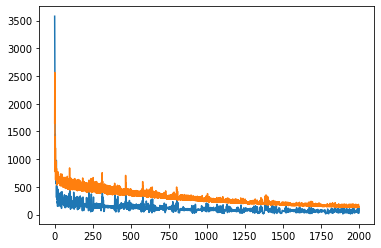

In [20]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [22]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = cnn_aadt_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [23]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 47.974308725458904


# Make predictions based on test set and get a root mean squared error 

In [24]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = cnn_aadt_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [25]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 324.7024156967269


# Plot train labels along with train predictions

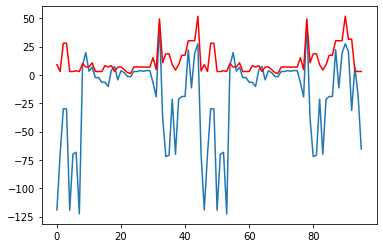

In [26]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

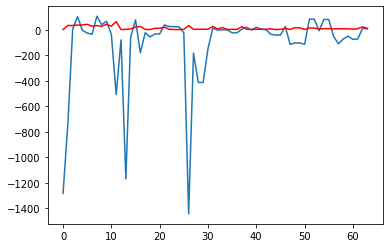

In [27]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of historical aadt data and normalization

In [28]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_with_Historical_AADT.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [29]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 162):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [30]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [31]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [32]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [33]:
for i in range(22):
    print(len(list_of_row_components[i]))

15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15


# Get length of list of lists

In [34]:
len(list_of_row_components)

3542

# Convert format of list to have a sinlge time series for each index

In [35]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [36]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [37]:
list_of_examples.shape

(160, 22, 15)

# Perform train test split for dataset

In [38]:
from sklearn.model_selection import train_test_split

n_train_periods = 96
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [39]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [40]:
train_y = train_y.reshape(96,)
test_y = test_y.reshape(64,)

In [41]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (96, 21, 14)
Shape of train_y: (96,)
Shape of test_X: (64, 21, 14)
Shape of test_y: (64,)


# Build CNN model

In [42]:
cnn_aadt_norm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.Conv1D(filters=64, kernel_size=3, input_shape=(train_X.shape[1],train_X.shape[2])),
    tf.keras.layers.GlobalMaxPooling1D(),
    tf.keras.layers.Dense(units=10),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [43]:
from tensorflow import keras

cnn_aadt_norm_model.compile(loss='mae', optimizer='adam')

# Train model

In [44]:
history = cnn_aadt_norm_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
3/3 - 0s - loss: 1.3051 - val_loss: 0.7468
Epoch 2/2000
3/3 - 0s - loss: 0.4814 - val_loss: 0.3076
Epoch 3/2000
3/3 - 0s - loss: 0.4074 - val_loss: 0.5339
Epoch 4/2000
3/3 - 0s - loss: 0.5071 - val_loss: 0.3935
Epoch 5/2000
3/3 - 0s - loss: 0.2841 - val_loss: 0.2838
Epoch 6/2000
3/3 - 0s - loss: 0.2351 - val_loss: 0.3628
Epoch 7/2000
3/3 - 0s - loss: 0.2969 - val_loss: 0.3192
Epoch 8/2000
3/3 - 0s - loss: 0.2150 - val_loss: 0.2656
Epoch 9/2000
3/3 - 0s - loss: 0.1984 - val_loss: 0.2761
Epoch 10/2000
3/3 - 0s - loss: 0.1926 - val_loss: 0.2635
Epoch 11/2000
3/3 - 0s - loss: 0.1560 - val_loss: 0.2890
Epoch 12/2000
3/3 - 0s - loss: 0.1703 - val_loss: 0.2732
Epoch 13/2000
3/3 - 0s - loss: 0.1464 - val_loss: 0.2564
Epoch 14/2000
3/3 - 0s - loss: 0.1500 - val_loss: 0.2561
Epoch 15/2000
3/3 - 0s - loss: 0.1263 - val_loss: 0.2714
Epoch 16/2000
3/3 - 0s - loss: 0.1298 - val_loss: 0.2618
Epoch 17/2000
3/3 - 0s - loss: 0.1162 - val_loss: 0.2512
Epoch 18/2000
3/3 - 0s - loss: 0.1096 - 

Epoch 141/2000
3/3 - 0s - loss: 0.0304 - val_loss: 0.2307
Epoch 142/2000
3/3 - 0s - loss: 0.0312 - val_loss: 0.2689
Epoch 143/2000
3/3 - 0s - loss: 0.0343 - val_loss: 0.2304
Epoch 144/2000
3/3 - 0s - loss: 0.0305 - val_loss: 0.2625
Epoch 145/2000
3/3 - 0s - loss: 0.0318 - val_loss: 0.2258
Epoch 146/2000
3/3 - 0s - loss: 0.0337 - val_loss: 0.2576
Epoch 147/2000
3/3 - 0s - loss: 0.0287 - val_loss: 0.2259
Epoch 148/2000
3/3 - 0s - loss: 0.0329 - val_loss: 0.2618
Epoch 149/2000
3/3 - 0s - loss: 0.0323 - val_loss: 0.2274
Epoch 150/2000
3/3 - 0s - loss: 0.0293 - val_loss: 0.2643
Epoch 151/2000
3/3 - 0s - loss: 0.0345 - val_loss: 0.2283
Epoch 152/2000
3/3 - 0s - loss: 0.0266 - val_loss: 0.2631
Epoch 153/2000
3/3 - 0s - loss: 0.0346 - val_loss: 0.2264
Epoch 154/2000
3/3 - 0s - loss: 0.0289 - val_loss: 0.2606
Epoch 155/2000
3/3 - 0s - loss: 0.0319 - val_loss: 0.2282
Epoch 156/2000
3/3 - 0s - loss: 0.0286 - val_loss: 0.2652
Epoch 157/2000
3/3 - 0s - loss: 0.0333 - val_loss: 0.2303
Epoch 158/2000

Epoch 283/2000
3/3 - 0s - loss: 0.0272 - val_loss: 0.2524
Epoch 284/2000
3/3 - 0s - loss: 0.0246 - val_loss: 0.2241
Epoch 285/2000
3/3 - 0s - loss: 0.0285 - val_loss: 0.2541
Epoch 286/2000
3/3 - 0s - loss: 0.0255 - val_loss: 0.2247
Epoch 287/2000
3/3 - 0s - loss: 0.0272 - val_loss: 0.2526
Epoch 288/2000
3/3 - 0s - loss: 0.0249 - val_loss: 0.2235
Epoch 289/2000
3/3 - 0s - loss: 0.0287 - val_loss: 0.2507
Epoch 290/2000
3/3 - 0s - loss: 0.0230 - val_loss: 0.2237
Epoch 291/2000
3/3 - 0s - loss: 0.0288 - val_loss: 0.2533
Epoch 292/2000
3/3 - 0s - loss: 0.0247 - val_loss: 0.2249
Epoch 293/2000
3/3 - 0s - loss: 0.0270 - val_loss: 0.2550
Epoch 294/2000
3/3 - 0s - loss: 0.0258 - val_loss: 0.2256
Epoch 295/2000
3/3 - 0s - loss: 0.0260 - val_loss: 0.2558
Epoch 296/2000
3/3 - 0s - loss: 0.0264 - val_loss: 0.2260
Epoch 297/2000
3/3 - 0s - loss: 0.0254 - val_loss: 0.2560
Epoch 298/2000
3/3 - 0s - loss: 0.0266 - val_loss: 0.2261
Epoch 299/2000
3/3 - 0s - loss: 0.0250 - val_loss: 0.2560
Epoch 300/2000

Epoch 425/2000
3/3 - 0s - loss: 0.0288 - val_loss: 0.2315
Epoch 426/2000
3/3 - 0s - loss: 0.0125 - val_loss: 0.2463
Epoch 427/2000
3/3 - 0s - loss: 0.0166 - val_loss: 0.2315
Epoch 428/2000
3/3 - 0s - loss: 0.0088 - val_loss: 0.2260
Epoch 429/2000
3/3 - 0s - loss: 0.0168 - val_loss: 0.2386
Epoch 430/2000
3/3 - 0s - loss: 0.0131 - val_loss: 0.2363
Epoch 431/2000
3/3 - 0s - loss: 0.0070 - val_loss: 0.2343
Epoch 432/2000
3/3 - 0s - loss: 0.0066 - val_loss: 0.2401
Epoch 433/2000
3/3 - 0s - loss: 0.0126 - val_loss: 0.2263
Epoch 434/2000
3/3 - 0s - loss: 0.0170 - val_loss: 0.2397
Epoch 435/2000
3/3 - 0s - loss: 0.0194 - val_loss: 0.2352
Epoch 436/2000
3/3 - 0s - loss: 0.0245 - val_loss: 0.2439
Epoch 437/2000
3/3 - 0s - loss: 0.0283 - val_loss: 0.2272
Epoch 438/2000
3/3 - 0s - loss: 0.0193 - val_loss: 0.2395
Epoch 439/2000
3/3 - 0s - loss: 0.0103 - val_loss: 0.2458
Epoch 440/2000
3/3 - 0s - loss: 0.0148 - val_loss: 0.2343
Epoch 441/2000
3/3 - 0s - loss: 0.0146 - val_loss: 0.2301
Epoch 442/2000

Epoch 567/2000
3/3 - 0s - loss: 0.0115 - val_loss: 0.2286
Epoch 568/2000
3/3 - 0s - loss: 0.0119 - val_loss: 0.2375
Epoch 569/2000
3/3 - 0s - loss: 0.0150 - val_loss: 0.2323
Epoch 570/2000
3/3 - 0s - loss: 0.0072 - val_loss: 0.2324
Epoch 571/2000
3/3 - 0s - loss: 0.0141 - val_loss: 0.2296
Epoch 572/2000
3/3 - 0s - loss: 0.0126 - val_loss: 0.2362
Epoch 573/2000
3/3 - 0s - loss: 0.0082 - val_loss: 0.2368
Epoch 574/2000
3/3 - 0s - loss: 0.0118 - val_loss: 0.2264
Epoch 575/2000
3/3 - 0s - loss: 0.0127 - val_loss: 0.2266
Epoch 576/2000
3/3 - 0s - loss: 0.0113 - val_loss: 0.2346
Epoch 577/2000
3/3 - 0s - loss: 0.0165 - val_loss: 0.2310
Epoch 578/2000
3/3 - 0s - loss: 0.0093 - val_loss: 0.2310
Epoch 579/2000
3/3 - 0s - loss: 0.0037 - val_loss: 0.2346
Epoch 580/2000
3/3 - 0s - loss: 0.0055 - val_loss: 0.2330
Epoch 581/2000
3/3 - 0s - loss: 0.0060 - val_loss: 0.2285
Epoch 582/2000
3/3 - 0s - loss: 0.0100 - val_loss: 0.2320
Epoch 583/2000
3/3 - 0s - loss: 0.0162 - val_loss: 0.2343
Epoch 584/2000

Epoch 709/2000
3/3 - 0s - loss: 0.0181 - val_loss: 0.2187
Epoch 710/2000
3/3 - 0s - loss: 0.0230 - val_loss: 0.2440
Epoch 711/2000
3/3 - 0s - loss: 0.0186 - val_loss: 0.2230
Epoch 712/2000
3/3 - 0s - loss: 0.0196 - val_loss: 0.2474
Epoch 713/2000
3/3 - 0s - loss: 0.0205 - val_loss: 0.2225
Epoch 714/2000
3/3 - 0s - loss: 0.0197 - val_loss: 0.2429
Epoch 715/2000
3/3 - 0s - loss: 0.0188 - val_loss: 0.2190
Epoch 716/2000
3/3 - 0s - loss: 0.0219 - val_loss: 0.2391
Epoch 717/2000
3/3 - 0s - loss: 0.0157 - val_loss: 0.2202
Epoch 718/2000
3/3 - 0s - loss: 0.0199 - val_loss: 0.2446
Epoch 719/2000
3/3 - 0s - loss: 0.0218 - val_loss: 0.2202
Epoch 720/2000
3/3 - 0s - loss: 0.0176 - val_loss: 0.2395
Epoch 721/2000
3/3 - 0s - loss: 0.0194 - val_loss: 0.2179
Epoch 722/2000
3/3 - 0s - loss: 0.0209 - val_loss: 0.2386
Epoch 723/2000
3/3 - 0s - loss: 0.0172 - val_loss: 0.2192
Epoch 724/2000
3/3 - 0s - loss: 0.0210 - val_loss: 0.2436
Epoch 725/2000
3/3 - 0s - loss: 0.0200 - val_loss: 0.2215
Epoch 726/2000

Epoch 851/2000
3/3 - 0s - loss: 0.0070 - val_loss: 0.2258
Epoch 852/2000
3/3 - 0s - loss: 0.0058 - val_loss: 0.2321
Epoch 853/2000
3/3 - 0s - loss: 0.0106 - val_loss: 0.2278
Epoch 854/2000
3/3 - 0s - loss: 0.0128 - val_loss: 0.2254
Epoch 855/2000
3/3 - 0s - loss: 0.0067 - val_loss: 0.2277
Epoch 856/2000
3/3 - 0s - loss: 0.0091 - val_loss: 0.2317
Epoch 857/2000
3/3 - 0s - loss: 0.0119 - val_loss: 0.2229
Epoch 858/2000
3/3 - 0s - loss: 0.0076 - val_loss: 0.2246
Epoch 859/2000
3/3 - 0s - loss: 0.0071 - val_loss: 0.2287
Epoch 860/2000
3/3 - 0s - loss: 0.0139 - val_loss: 0.2275
Epoch 861/2000
3/3 - 0s - loss: 0.0172 - val_loss: 0.2284
Epoch 862/2000
3/3 - 0s - loss: 0.0077 - val_loss: 0.2327
Epoch 863/2000
3/3 - 0s - loss: 0.0111 - val_loss: 0.2246
Epoch 864/2000
3/3 - 0s - loss: 0.0090 - val_loss: 0.2236
Epoch 865/2000
3/3 - 0s - loss: 0.0101 - val_loss: 0.2298
Epoch 866/2000
3/3 - 0s - loss: 0.0103 - val_loss: 0.2319
Epoch 867/2000
3/3 - 0s - loss: 0.0106 - val_loss: 0.2248
Epoch 868/2000

Epoch 993/2000
3/3 - 0s - loss: 0.0085 - val_loss: 0.2226
Epoch 994/2000
3/3 - 0s - loss: 0.0133 - val_loss: 0.2267
Epoch 995/2000
3/3 - 0s - loss: 0.0043 - val_loss: 0.2229
Epoch 996/2000
3/3 - 0s - loss: 0.0070 - val_loss: 0.2266
Epoch 997/2000
3/3 - 0s - loss: 0.0149 - val_loss: 0.2261
Epoch 998/2000
3/3 - 0s - loss: 0.0074 - val_loss: 0.2264
Epoch 999/2000
3/3 - 0s - loss: 0.0062 - val_loss: 0.2231
Epoch 1000/2000
3/3 - 0s - loss: 0.0078 - val_loss: 0.2193
Epoch 1001/2000
3/3 - 0s - loss: 0.0129 - val_loss: 0.2309
Epoch 1002/2000
3/3 - 0s - loss: 0.0118 - val_loss: 0.2230
Epoch 1003/2000
3/3 - 0s - loss: 0.0051 - val_loss: 0.2233
Epoch 1004/2000
3/3 - 0s - loss: 0.0067 - val_loss: 0.2258
Epoch 1005/2000
3/3 - 0s - loss: 0.0037 - val_loss: 0.2261
Epoch 1006/2000
3/3 - 0s - loss: 0.0064 - val_loss: 0.2316
Epoch 1007/2000
3/3 - 0s - loss: 0.0141 - val_loss: 0.2207
Epoch 1008/2000
3/3 - 0s - loss: 0.0107 - val_loss: 0.2227
Epoch 1009/2000
3/3 - 0s - loss: 0.0069 - val_loss: 0.2231
Epoc

Epoch 1132/2000
3/3 - 0s - loss: 0.0070 - val_loss: 0.2309
Epoch 1133/2000
3/3 - 0s - loss: 0.0129 - val_loss: 0.2200
Epoch 1134/2000
3/3 - 0s - loss: 0.0086 - val_loss: 0.2229
Epoch 1135/2000
3/3 - 0s - loss: 0.0036 - val_loss: 0.2261
Epoch 1136/2000
3/3 - 0s - loss: 0.0058 - val_loss: 0.2317
Epoch 1137/2000
3/3 - 0s - loss: 0.0118 - val_loss: 0.2214
Epoch 1138/2000
3/3 - 0s - loss: 0.0132 - val_loss: 0.2236
Epoch 1139/2000
3/3 - 0s - loss: 0.0060 - val_loss: 0.2201
Epoch 1140/2000
3/3 - 0s - loss: 0.0074 - val_loss: 0.2238
Epoch 1141/2000
3/3 - 0s - loss: 0.0174 - val_loss: 0.2212
Epoch 1142/2000
3/3 - 0s - loss: 0.0080 - val_loss: 0.2206
Epoch 1143/2000
3/3 - 0s - loss: 0.0060 - val_loss: 0.2249
Epoch 1144/2000
3/3 - 0s - loss: 0.0154 - val_loss: 0.2228
Epoch 1145/2000
3/3 - 0s - loss: 0.0149 - val_loss: 0.2236
Epoch 1146/2000
3/3 - 0s - loss: 0.0096 - val_loss: 0.2288
Epoch 1147/2000
3/3 - 0s - loss: 0.0123 - val_loss: 0.2168
Epoch 1148/2000
3/3 - 0s - loss: 0.0132 - val_loss: 0.22

Epoch 1271/2000
3/3 - 0s - loss: 0.0087 - val_loss: 0.2231
Epoch 1272/2000
3/3 - 0s - loss: 0.0121 - val_loss: 0.2221
Epoch 1273/2000
3/3 - 0s - loss: 0.0084 - val_loss: 0.2161
Epoch 1274/2000
3/3 - 0s - loss: 0.0129 - val_loss: 0.2314
Epoch 1275/2000
3/3 - 0s - loss: 0.0221 - val_loss: 0.2159
Epoch 1276/2000
3/3 - 0s - loss: 0.0176 - val_loss: 0.2262
Epoch 1277/2000
3/3 - 0s - loss: 0.0136 - val_loss: 0.2144
Epoch 1278/2000
3/3 - 0s - loss: 0.0196 - val_loss: 0.2281
Epoch 1279/2000
3/3 - 0s - loss: 0.0179 - val_loss: 0.2170
Epoch 1280/2000
3/3 - 0s - loss: 0.0146 - val_loss: 0.2293
Epoch 1281/2000
3/3 - 0s - loss: 0.0171 - val_loss: 0.2149
Epoch 1282/2000
3/3 - 0s - loss: 0.0212 - val_loss: 0.2247
Epoch 1283/2000
3/3 - 0s - loss: 0.0106 - val_loss: 0.2162
Epoch 1284/2000
3/3 - 0s - loss: 0.0103 - val_loss: 0.2251
Epoch 1285/2000
3/3 - 0s - loss: 0.0081 - val_loss: 0.2260
Epoch 1286/2000
3/3 - 0s - loss: 0.0097 - val_loss: 0.2192
Epoch 1287/2000
3/3 - 0s - loss: 0.0130 - val_loss: 0.22

Epoch 1410/2000
3/3 - 0s - loss: 0.0109 - val_loss: 0.2217
Epoch 1411/2000
3/3 - 0s - loss: 0.0072 - val_loss: 0.2189
Epoch 1412/2000
3/3 - 0s - loss: 0.0143 - val_loss: 0.2222
Epoch 1413/2000
3/3 - 0s - loss: 0.0125 - val_loss: 0.2200
Epoch 1414/2000
3/3 - 0s - loss: 0.0233 - val_loss: 0.2333
Epoch 1415/2000
3/3 - 0s - loss: 0.0167 - val_loss: 0.2120
Epoch 1416/2000
3/3 - 0s - loss: 0.0196 - val_loss: 0.2297
Epoch 1417/2000
3/3 - 0s - loss: 0.0146 - val_loss: 0.2145
Epoch 1418/2000
3/3 - 0s - loss: 0.0156 - val_loss: 0.2335
Epoch 1419/2000
3/3 - 0s - loss: 0.0181 - val_loss: 0.2148
Epoch 1420/2000
3/3 - 0s - loss: 0.0127 - val_loss: 0.2269
Epoch 1421/2000
3/3 - 0s - loss: 0.0118 - val_loss: 0.2164
Epoch 1422/2000
3/3 - 0s - loss: 0.0106 - val_loss: 0.2181
Epoch 1423/2000
3/3 - 0s - loss: 0.0068 - val_loss: 0.2210
Epoch 1424/2000
3/3 - 0s - loss: 0.0049 - val_loss: 0.2225
Epoch 1425/2000
3/3 - 0s - loss: 0.0057 - val_loss: 0.2242
Epoch 1426/2000
3/3 - 0s - loss: 0.0077 - val_loss: 0.21

Epoch 1549/2000
3/3 - 0s - loss: 0.0052 - val_loss: 0.2186
Epoch 1550/2000
3/3 - 0s - loss: 0.0153 - val_loss: 0.2221
Epoch 1551/2000
3/3 - 0s - loss: 0.0194 - val_loss: 0.2135
Epoch 1552/2000
3/3 - 0s - loss: 0.0149 - val_loss: 0.2235
Epoch 1553/2000
3/3 - 0s - loss: 0.0133 - val_loss: 0.2182
Epoch 1554/2000
3/3 - 0s - loss: 0.0190 - val_loss: 0.2276
Epoch 1555/2000
3/3 - 0s - loss: 0.0141 - val_loss: 0.2184
Epoch 1556/2000
3/3 - 0s - loss: 0.0143 - val_loss: 0.2223
Epoch 1557/2000
3/3 - 0s - loss: 0.0217 - val_loss: 0.2124
Epoch 1558/2000
3/3 - 0s - loss: 0.0198 - val_loss: 0.2396
Epoch 1559/2000
3/3 - 0s - loss: 0.0266 - val_loss: 0.2114
Epoch 1560/2000
3/3 - 0s - loss: 0.0411 - val_loss: 0.2111
Epoch 1561/2000
3/3 - 0s - loss: 0.0191 - val_loss: 0.2322
Epoch 1562/2000
3/3 - 0s - loss: 0.0215 - val_loss: 0.2112
Epoch 1563/2000
3/3 - 0s - loss: 0.0143 - val_loss: 0.2284
Epoch 1564/2000
3/3 - 0s - loss: 0.0171 - val_loss: 0.2146
Epoch 1565/2000
3/3 - 0s - loss: 0.0092 - val_loss: 0.22

Epoch 1688/2000
3/3 - 0s - loss: 0.0044 - val_loss: 0.2253
Epoch 1689/2000
3/3 - 0s - loss: 0.0122 - val_loss: 0.2165
Epoch 1690/2000
3/3 - 0s - loss: 0.0059 - val_loss: 0.2139
Epoch 1691/2000
3/3 - 0s - loss: 0.0108 - val_loss: 0.2218
Epoch 1692/2000
3/3 - 0s - loss: 0.0087 - val_loss: 0.2203
Epoch 1693/2000
3/3 - 0s - loss: 0.0043 - val_loss: 0.2224
Epoch 1694/2000
3/3 - 0s - loss: 0.0076 - val_loss: 0.2157
Epoch 1695/2000
3/3 - 0s - loss: 0.0128 - val_loss: 0.2202
Epoch 1696/2000
3/3 - 0s - loss: 0.0051 - val_loss: 0.2206
Epoch 1697/2000
3/3 - 0s - loss: 0.0057 - val_loss: 0.2185
Epoch 1698/2000
3/3 - 0s - loss: 0.0040 - val_loss: 0.2158
Epoch 1699/2000
3/3 - 0s - loss: 0.0085 - val_loss: 0.2217
Epoch 1700/2000
3/3 - 0s - loss: 0.0126 - val_loss: 0.2190
Epoch 1701/2000
3/3 - 0s - loss: 0.0064 - val_loss: 0.2136
Epoch 1702/2000
3/3 - 0s - loss: 0.0131 - val_loss: 0.2289
Epoch 1703/2000
3/3 - 0s - loss: 0.0257 - val_loss: 0.2184
Epoch 1704/2000
3/3 - 0s - loss: 0.0095 - val_loss: 0.22

Epoch 1827/2000
3/3 - 0s - loss: 0.0043 - val_loss: 0.2162
Epoch 1828/2000
3/3 - 0s - loss: 0.0065 - val_loss: 0.2136
Epoch 1829/2000
3/3 - 0s - loss: 0.0111 - val_loss: 0.2227
Epoch 1830/2000
3/3 - 0s - loss: 0.0125 - val_loss: 0.2127
Epoch 1831/2000
3/3 - 0s - loss: 0.0082 - val_loss: 0.2201
Epoch 1832/2000
3/3 - 0s - loss: 0.0137 - val_loss: 0.2174
Epoch 1833/2000
3/3 - 0s - loss: 0.0151 - val_loss: 0.2199
Epoch 1834/2000
3/3 - 0s - loss: 0.0090 - val_loss: 0.2188
Epoch 1835/2000
3/3 - 0s - loss: 0.0106 - val_loss: 0.2138
Epoch 1836/2000
3/3 - 0s - loss: 0.0090 - val_loss: 0.2193
Epoch 1837/2000
3/3 - 0s - loss: 0.0090 - val_loss: 0.2187
Epoch 1838/2000
3/3 - 0s - loss: 0.0047 - val_loss: 0.2198
Epoch 1839/2000
3/3 - 0s - loss: 0.0052 - val_loss: 0.2149
Epoch 1840/2000
3/3 - 0s - loss: 0.0102 - val_loss: 0.2196
Epoch 1841/2000
3/3 - 0s - loss: 0.0124 - val_loss: 0.2170
Epoch 1842/2000
3/3 - 0s - loss: 0.0059 - val_loss: 0.2142
Epoch 1843/2000
3/3 - 0s - loss: 0.0083 - val_loss: 0.22

Epoch 1966/2000
3/3 - 0s - loss: 0.0155 - val_loss: 0.2269
Epoch 1967/2000
3/3 - 0s - loss: 0.0187 - val_loss: 0.2081
Epoch 1968/2000
3/3 - 0s - loss: 0.0166 - val_loss: 0.2231
Epoch 1969/2000
3/3 - 0s - loss: 0.0127 - val_loss: 0.2128
Epoch 1970/2000
3/3 - 0s - loss: 0.0081 - val_loss: 0.2167
Epoch 1971/2000
3/3 - 0s - loss: 0.0053 - val_loss: 0.2217
Epoch 1972/2000
3/3 - 0s - loss: 0.0109 - val_loss: 0.2140
Epoch 1973/2000
3/3 - 0s - loss: 0.0053 - val_loss: 0.2128
Epoch 1974/2000
3/3 - 0s - loss: 0.0099 - val_loss: 0.2222
Epoch 1975/2000
3/3 - 0s - loss: 0.0130 - val_loss: 0.2105
Epoch 1976/2000
3/3 - 0s - loss: 0.0107 - val_loss: 0.2209
Epoch 1977/2000
3/3 - 0s - loss: 0.0091 - val_loss: 0.2203
Epoch 1978/2000
3/3 - 0s - loss: 0.0080 - val_loss: 0.2148
Epoch 1979/2000
3/3 - 0s - loss: 0.0106 - val_loss: 0.2161
Epoch 1980/2000
3/3 - 0s - loss: 0.0064 - val_loss: 0.2165
Epoch 1981/2000
3/3 - 0s - loss: 0.0094 - val_loss: 0.2191
Epoch 1982/2000
3/3 - 0s - loss: 0.0097 - val_loss: 0.21

# Plot model loss and validation loss

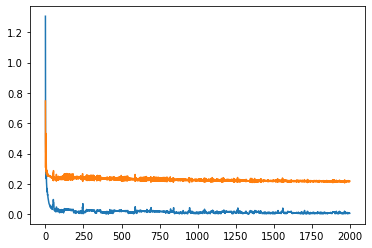

In [45]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [46]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = cnn_aadt_norm_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [47]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.007049423804409304


# Make predictions based on test set and get a root mean squared error 

In [48]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = cnn_aadt_norm_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [49]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.2818408519538913


# Plot train labels along with train predictions

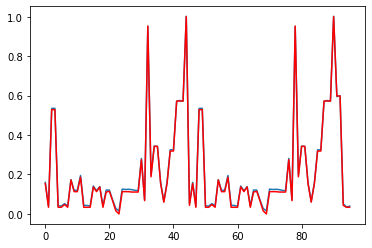

In [50]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

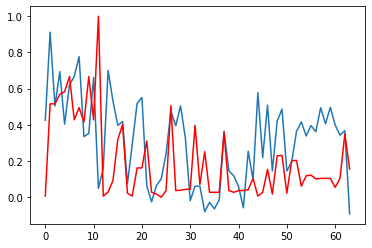

In [51]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()